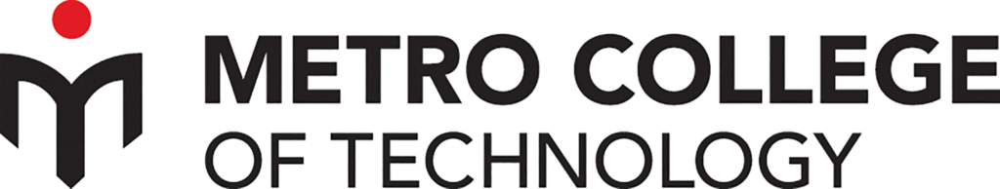

# Project For Predicting Borrowers Paying Back Fully and Comparison of performance of Logistic Regression, Decision Tree and Random Forest Algorithms.

# --------------------------------------------------------- 
# Submitted by:
# Mohammad Monjur-E-Elahi
# Course: Python for Data Analytics [DSA08]
# Program: Data Science and Application - Advanced Diploma [6060]
# Metro College of Technology
# Date: 5 April, 2021

# ---------------------------------------------------------
# Introduction:

In this project we will be exploring publicly available data from LendingClub.com. Lending Club connects people who need money (borrowers) with people who have money (investors). As an investor anyone would want to invest in people who showed a profile of having a high probability of paying him back. We will try to create a model that will help predict this.

We will be performing EDA, Feature Engineering and Visualization while answering relevant questions that we need to ask ourselves in this journey to make the dataset ready for logistic regression, decision tree and random forest models development and evaluation of the same. We will end by comparison of the performance of the three algorithms.



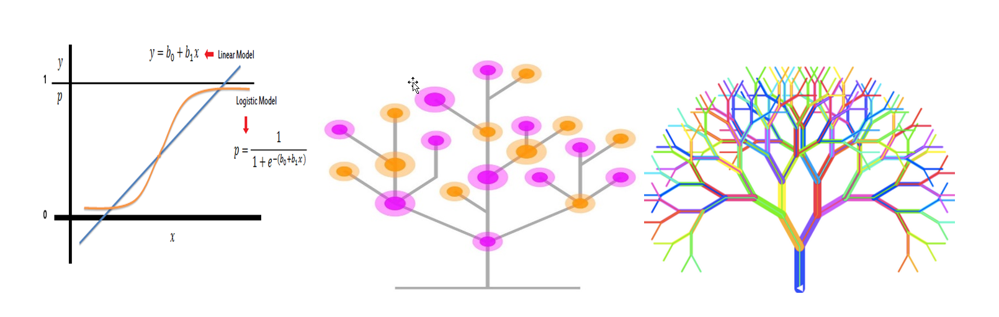

**We will start with importing the the requied libraries and modules.**

In [1]:
import os
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600
import seaborn as sns
sns.set(rc={"figure.dpi":600, 'savefig.dpi':600})
sns.set_context('notebook')
sns.set_style("ticks")
%matplotlib inline
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


**Then we need to set the working directory for our project.**

In [2]:
os.chdir(r'C:\Users\ruzdomain\Desktop\Python_DataScience\PROJECT_PRESENTING')

In [3]:
os.getcwd()

'C:\\Users\\ruzdomain\\Desktop\\Python_DataScience\\PROJECT_PRESENTING'

# Getting the Data
Let us read in the Loan_data.csv file and set it to a panada data frame called loans.

In [4]:
loans = pd.read_csv('loan_data.csv', na_values = 'NA')

# Q1:
**We had to familarize ourselves with the different columns and what they meant.**

In [5]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9620 entries, 0 to 9619
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9596 non-null   float64
 1   purpose            9591 non-null   object 
 2   int.rate           9596 non-null   float64
 3   installment        9596 non-null   float64
 4   log.annual.inc     9596 non-null   float64
 5   dti                9596 non-null   float64
 6   fico               9596 non-null   float64
 7   days.with.cr.line  9596 non-null   float64
 8   revol.bal          9596 non-null   float64
 9   revol.util         9596 non-null   float64
 10  inq.last.6mths     9596 non-null   float64
 11  delinq.2yrs        9596 non-null   float64
 12  pub.rec            9596 non-null   float64
 13  not.fully.paid     9588 non-null   float64
dtypes: float64(13), object(1)
memory usage: 1.0+ MB


# Here are what the columns represent:

**credit.policy:**
1 if the customer meets the credit underwriting criteria of LendingClub.com, and 0 otherwise.


**purpose:**
The purpose of the loan (takes values "credit_card", "debt_consolidation", "educational", "major_purchase", "small_business", and "all_other").


**int.rate:**
The interest rate of the loan, as a proportion (a rate of 11% would be stored as 0.11). Borrowers judged by LendingClub.com to be more risky are assigned higher interest rates.


**installment:** 
The monthly installments owed by the borrower if the loan is funded.


**log.annual.inc:** 
The natural log of the self-reported annual income of the borrower.


**dti:** 
The debt-to-income ratio of the borrower (amount of debt divided by annual income).


**fico:** 
The FICO(Fair Isaac Corporation) credit score of the borrower. The base FICO® Scores range from 300 to 850.


**days.with.cr.line:** 
The number of days the borrower has had a credit line.


**revol.bal:** 
The borrower's revolving balance (amount unpaid at the end of the credit card billing cycle).


**revol.util:** 
The borrower's revolving line utilization rate (the amount of the credit line used relative to total credit available).


**inq.last.6mths:** 
The borrower's number of inquiries by creditors in the last 6 months.


**delinq.2yrs:** 
The number of times the borrower had been 30+ days past due on a payment in the past 2 years.


**pub.rec:** 
The borrower's number of derogatory public records (bankruptcy filings, tax liens, or judgments).


**not.fully.paid:**
It is 1 if the borrower failed to payback fully and 0 if they are in good terms.

# Q2:
**Did we explore various parameters of the dataset?**

In [6]:
type(loans)

pandas.core.frame.DataFrame

In [7]:
loans.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9596.000000,9596.000000,9596.000000,9596.000000,9596.000000,9596.000000,9596.000000,9.596000e+03,9596.000000,9596.000000,9596.000000,9596.000000,9588.000000
mean,0.805336,0.122632,319.092934,10.932314,12.608509,710.861088,4560.837840,1.690692e+04,46.796496,1.577011,0.163401,0.062109,0.160096
std,0.395963,0.026842,207.034780,0.614649,6.881133,37.959914,2497.099720,3.372999e+04,29.011032,2.198822,0.545748,0.262068,0.366714
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.220000,682.000000,2820.000000,3.190750e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.670000,707.000000,4139.500000,8.593000e+03,46.250000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.487500,11.294769,17.950000,737.000000,5730.000000,1.824450e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


In [8]:
loans.head(10)

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1.0,debt_consolidation,0.1189,829.10,11.350407,19.48,737.0,5639.958333,28854.0,52.1,0.0,0.0,0.0,0.0
1,1.0,credit_card,0.1071,228.22,11.082143,14.29,707.0,2760.000000,33623.0,76.7,0.0,0.0,0.0,0.0
2,1.0,debt_consolidation,0.1357,366.86,10.373491,11.63,682.0,4710.000000,3511.0,25.6,1.0,0.0,0.0,0.0
3,1.0,debt_consolidation,0.1008,162.34,11.350407,8.10,712.0,2699.958333,33667.0,73.2,1.0,0.0,0.0,0.0
4,1.0,credit_card,0.1426,102.92,11.299732,14.97,667.0,4066.000000,4740.0,39.5,0.0,1.0,0.0,0.0
5,1.0,credit_card,0.0788,125.13,11.904968,16.98,727.0,6120.041667,50807.0,51.0,0.0,0.0,0.0,0.0
6,1.0,debt_consolidation,0.1496,194.02,10.714418,4.00,667.0,3180.041667,3839.0,76.8,0.0,0.0,1.0,1.0
7,1.0,all_other,0.1114,131.22,11.002100,11.08,722.0,5116.000000,24220.0,68.6,0.0,0.0,0.0,1.0
8,1.0,home_improvement,0.1134,87.19,11.407565,17.25,682.0,3989.000000,69909.0,51.1,1.0,0.0,0.0,0.0
9,1.0,debt_consolidation,0.1221,84.12,10.203592,10.00,707.0,2730.041667,5630.0,23.0,1.0,0.0,0.0,0.0


In [9]:
loans.tail(10)

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
9610,0.0,all_other,0.1979,37.06,10.645425,22.17,667.0,5916.000000,28854.0,59.8,6.0,0.0,1.0,0.0
9611,0.0,home_improvement,0.1426,823.34,12.429216,3.62,722.0,3239.958333,33575.0,83.9,5.0,0.0,0.0,1.0
9612,0.0,all_other,0.1671,113.63,10.645425,28.06,672.0,3210.041667,25759.0,63.8,5.0,0.0,0.0,1.0
9613,0.0,all_other,0.1568,161.01,11.225243,8.00,677.0,7230.000000,6909.0,29.2,4.0,0.0,1.0,1.0
9614,0.0,debt_consolidation,0.1565,69.98,10.110472,7.02,662.0,8190.041667,2999.0,39.5,6.0,0.0,0.0,1.0
9615,0.0,all_other,0.1461,344.76,12.180755,10.39,672.0,10474.000000,215372.0,82.1,2.0,0.0,0.0,1.0
9616,0.0,all_other,0.1253,257.70,11.141862,0.21,722.0,4380.000000,184.0,1.1,5.0,0.0,0.0,1.0
9617,0.0,debt_consolidation,0.1071,97.81,10.596635,13.09,687.0,3450.041667,10036.0,82.9,8.0,0.0,0.0,1.0
9618,0.0,home_improvement,0.1600,351.58,10.819778,19.18,692.0,1800.000000,0.0,3.2,5.0,0.0,0.0,1.0
9619,0.0,debt_consolidation,0.1392,853.43,11.264464,16.28,732.0,4740.000000,37879.0,57.0,6.0,0.0,0.0,1.0


In [10]:
loans.shape

(9620, 14)

In [11]:
loans.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

In [12]:
loans.dtypes

credit.policy        float64
purpose               object
int.rate             float64
installment          float64
log.annual.inc       float64
dti                  float64
fico                 float64
days.with.cr.line    float64
revol.bal            float64
revol.util           float64
inq.last.6mths       float64
delinq.2yrs          float64
pub.rec              float64
not.fully.paid       float64
dtype: object

# Q3:
**Did we opt to change the column names?**

In [13]:
loans.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

In [14]:
loans=loans.rename(columns={'credit.policy':"CreditPolicy",'purpose':'Purpose', 'int.rate':'InterestRate', 
                           'installment':'Installment', 'log.annual.inc':'AnnualIncomeLn', 'dti':'DebtToIncome',
                           'fico':'FICO.Score', 'days.with.cr.line':'DaysSinceSubscription', 'revol.bal': 'RevolvingBalance',
                           'revol.util':"DebtToLimitRatio", 'inq.last.6mths':'InquirySixMonths', 
                           'delinq.2yrs':'DelayedPaymentsTwoYears', 'pub.rec':'DerogatoryPublicRecords',
                           'not.fully.paid':'NotFullyPaid'})

In [15]:
loans.columns

Index(['CreditPolicy', 'Purpose', 'InterestRate', 'Installment',
       'AnnualIncomeLn', 'DebtToIncome', 'FICO.Score', 'DaysSinceSubscription',
       'RevolvingBalance', 'DebtToLimitRatio', 'InquirySixMonths',
       'DelayedPaymentsTwoYears', 'DerogatoryPublicRecords', 'NotFullyPaid'],
      dtype='object')

In [16]:
loans.dtypes

CreditPolicy               float64
Purpose                     object
InterestRate               float64
Installment                float64
AnnualIncomeLn             float64
DebtToIncome               float64
FICO.Score                 float64
DaysSinceSubscription      float64
RevolvingBalance           float64
DebtToLimitRatio           float64
InquirySixMonths           float64
DelayedPaymentsTwoYears    float64
DerogatoryPublicRecords    float64
NotFullyPaid               float64
dtype: object

# Q4:
**Did we deal with null and missing values?**

In [17]:
loans.apply(lambda x: sum(x.isnull()))

CreditPolicy               24
Purpose                    29
InterestRate               24
Installment                24
AnnualIncomeLn             24
DebtToIncome               24
FICO.Score                 24
DaysSinceSubscription      24
RevolvingBalance           24
DebtToLimitRatio           24
InquirySixMonths           24
DelayedPaymentsTwoYears    24
DerogatoryPublicRecords    24
NotFullyPaid               32
dtype: int64

In [18]:
def percentage_of_miss(df):
  df1=df[df.columns[df.isnull().sum()>=1]]
  total_miss = df1.isnull().sum().sort_values(ascending=False)
  percent_miss = (df1.isnull().sum()/df1.isnull().count()).sort_values(ascending=False)
  missing_data = pd.concat([total_miss, percent_miss], axis=1, keys=['Number of Missing', 'Percentage'])
  return(missing_data)

In [19]:
percentage_of_miss(loans)

,Number of Missing,Percentage
NotFullyPaid,32,0.003326
Purpose,29,0.003015
DerogatoryPublicRecords,24,0.002495
DelayedPaymentsTwoYears,24,0.002495
InquirySixMonths,24,0.002495
DebtToLimitRatio,24,0.002495
RevolvingBalance,24,0.002495
DaysSinceSubscription,24,0.002495
FICO.Score,24,0.002495
DebtToIncome,24,0.002495


<AxesSubplot:>

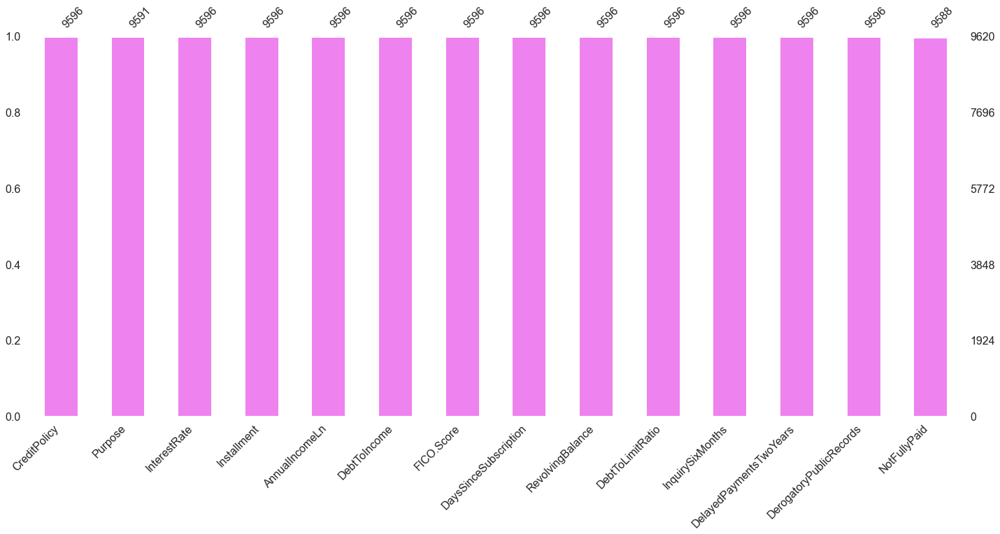

In [20]:

msno.bar(loans, color ='violet')

<AxesSubplot:>

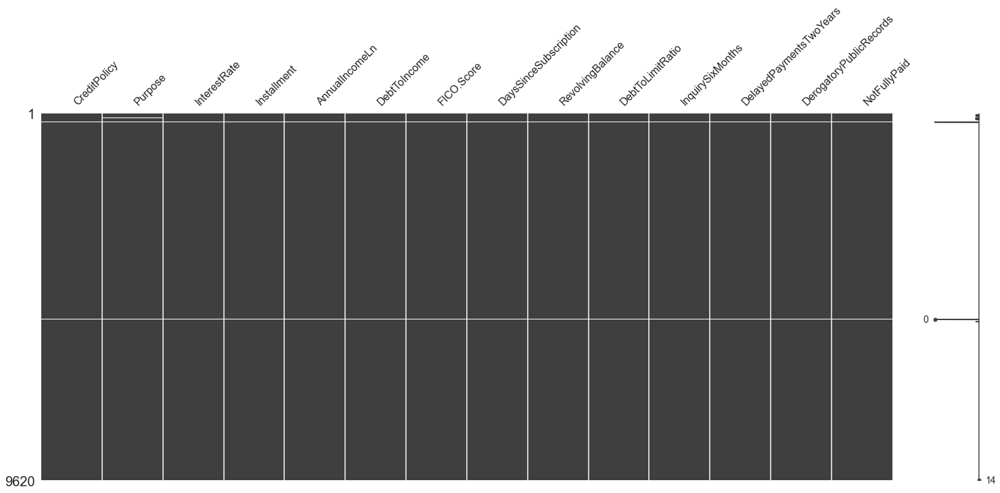

In [21]:
msno.matrix(loans)

In [22]:
loans = loans.dropna( how='all')

In [23]:
percentage_of_miss(loans)

,Number of Missing,Percentage
NotFullyPaid,8,0.000834
Purpose,5,0.000521


**Let us now delete all the rows where the NotFullyPaid columns have missing values since this is our target column for training and testing the model.**

In [24]:
loans = loans.dropna( how='any',
                    subset=['NotFullyPaid'])

In [25]:
percentage_of_miss(loans)

,Number of Missing,Percentage
Purpose,5,0.000521


In [26]:
loans["Purpose"].value_counts()

debt_consolidation    3959
all_other             2328
credit_card           1265
home_improvement       629
small_business         620
major_purchase         438
educational            344
Name: Purpose, dtype: int64

In [27]:
duplicateRowsLoans = loans[loans.duplicated()]
duplicateRowsLoans

,CreditPolicy,Purpose,InterestRate,Installment,AnnualIncomeLn,DebtToIncome,FICO.Score,DaysSinceSubscription,RevolvingBalance,DebtToLimitRatio,InquirySixMonths,DelayedPaymentsTwoYears,DerogatoryPublicRecords,NotFullyPaid
4879,1.0,debt_consolidation,0.1218,93.24,11.461632,16.96,697.0,8130.000000,40868.0,86.6,3.0,0.0,0.0,1.0
4880,1.0,credit_card,0.1218,549.45,11.225243,16.06,717.0,5039.958333,43373.0,66.9,0.0,0.0,0.0,0.0
4881,1.0,debt_consolidation,0.1218,499.50,10.819778,21.24,722.0,3300.000000,7322.0,31.8,0.0,0.0,0.0,1.0
4882,1.0,educational,0.1183,410.87,11.944708,17.38,717.0,7169.958333,452.0,8.4,1.0,0.0,0.0,0.0
4883,1.0,all_other,0.1148,69.24,10.714418,18.24,717.0,1830.000000,6554.0,55.1,2.0,0.0,0.0,0.0
4884,1.0,all_other,0.1218,366.30,11.695247,9.38,707.0,11460.000000,9772.0,41.8,1.0,0.0,0.0,0.0
4885,1.0,credit_card,0.0859,202.31,10.734220,15.24,747.0,8400.000000,13010.0,36.8,0.0,0.0,0.0,0.0
4886,1.0,major_purchase,0.1148,659.37,10.534334,10.19,767.0,3959.958333,5110.0,36.5,0.0,0.0,0.0,0.0
4887,1.0,credit_card,0.0859,271.85,11.461632,16.16,752.0,4050.000000,30330.0,30.9,2.0,0.0,0.0,0.0
4888,1.0,small_business,0.1774,720.42,11.243319,7.04,702.0,5100.000000,11829.0,74.4,3.0,0.0,1.0,0.0


In [28]:
loans.drop_duplicates(keep=False,inplace=True)

In [29]:
duplicateRowsLoans = loans[loans.duplicated()]
duplicateRowsLoans

,CreditPolicy,Purpose,InterestRate,Installment,AnnualIncomeLn,DebtToIncome,FICO.Score,DaysSinceSubscription,RevolvingBalance,DebtToLimitRatio,InquirySixMonths,DelayedPaymentsTwoYears,DerogatoryPublicRecords,NotFullyPaid


In [30]:
loans["Purpose"].value_counts()

debt_consolidation    3955
all_other             2324
credit_card           1259
home_improvement       629
small_business         618
major_purchase         436
educational            342
Name: Purpose, dtype: int64

In [31]:
percentage_of_miss(loans)

,Number of Missing,Percentage
Purpose,5,0.000523


In [32]:
def impute_nan_most_frequent_category(DataFrame,ColName):
    most_frequent_category=DataFrame[ColName].mode()[0]
    DataFrame[ColName].fillna(most_frequent_category,inplace=True)

In [33]:
impute_nan_most_frequent_category(loans, 'Purpose')

In [34]:
percentage_of_miss(loans)

,Number of Missing,Percentage


In [35]:
loans["Purpose"].value_counts()

debt_consolidation    3960
all_other             2324
credit_card           1259
home_improvement       629
small_business         618
major_purchase         436
educational            342
Name: Purpose, dtype: int64

In [36]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9568 entries, 0 to 9619
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CreditPolicy             9568 non-null   float64
 1   Purpose                  9568 non-null   object 
 2   InterestRate             9568 non-null   float64
 3   Installment              9568 non-null   float64
 4   AnnualIncomeLn           9568 non-null   float64
 5   DebtToIncome             9568 non-null   float64
 6   FICO.Score               9568 non-null   float64
 7   DaysSinceSubscription    9568 non-null   float64
 8   RevolvingBalance         9568 non-null   float64
 9   DebtToLimitRatio         9568 non-null   float64
 10  InquirySixMonths         9568 non-null   float64
 11  DelayedPaymentsTwoYears  9568 non-null   float64
 12  DerogatoryPublicRecords  9568 non-null   float64
 13  NotFullyPaid             9568 non-null   float64
dtypes: float64(13), object(1

<AxesSubplot:>

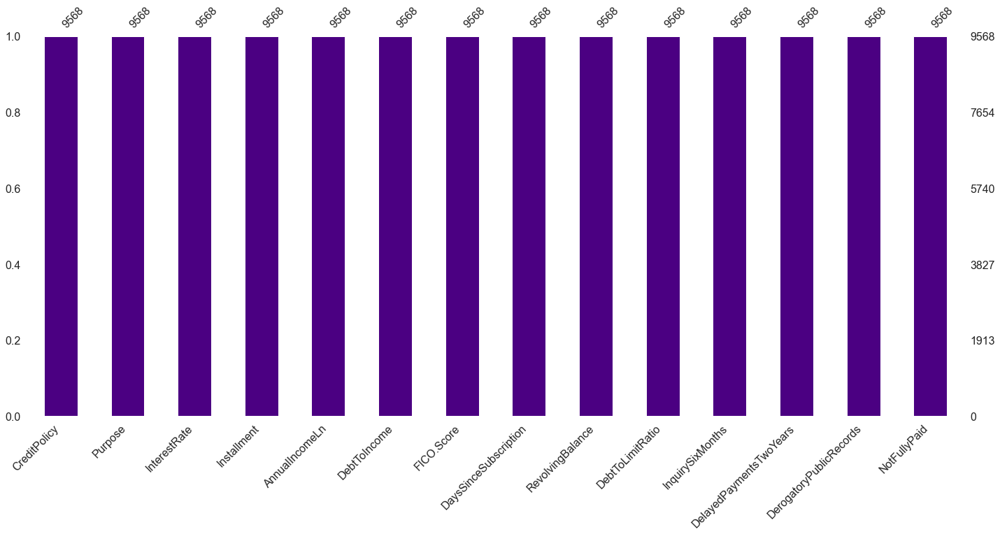

In [37]:
msno.bar(loans, color ='indigo')

<AxesSubplot:>

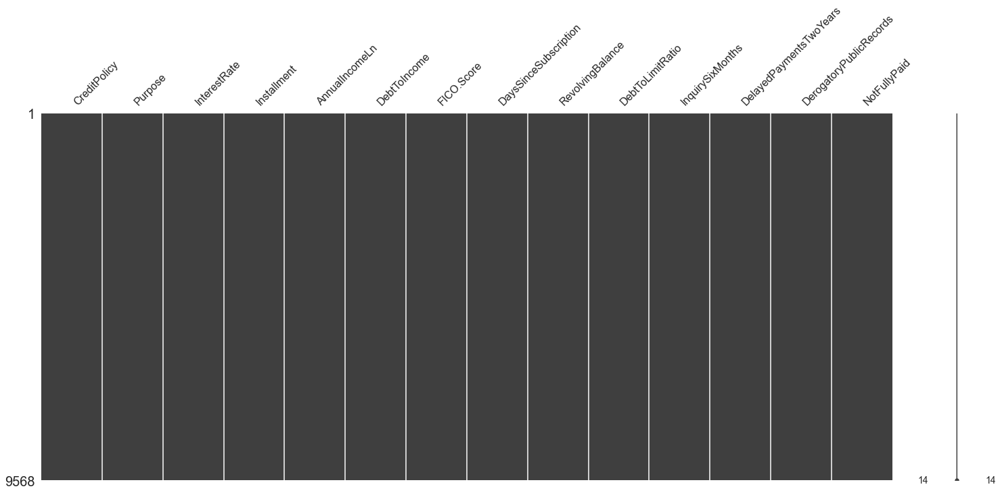

In [38]:
msno.matrix(loans)

In [39]:
duplicateRowsLoans = loans[loans.duplicated()]
duplicateRowsLoans

,CreditPolicy,Purpose,InterestRate,Installment,AnnualIncomeLn,DebtToIncome,FICO.Score,DaysSinceSubscription,RevolvingBalance,DebtToLimitRatio,InquirySixMonths,DelayedPaymentsTwoYears,DerogatoryPublicRecords,NotFullyPaid


# Q5:
**Did we analyze the target column which was the NotFullyPaid columns in our dataframe?**

In [40]:
NFP=loans['NotFullyPaid'].value_counts()
NFP

0.0    8037
1.0    1531
Name: NotFullyPaid, dtype: int64

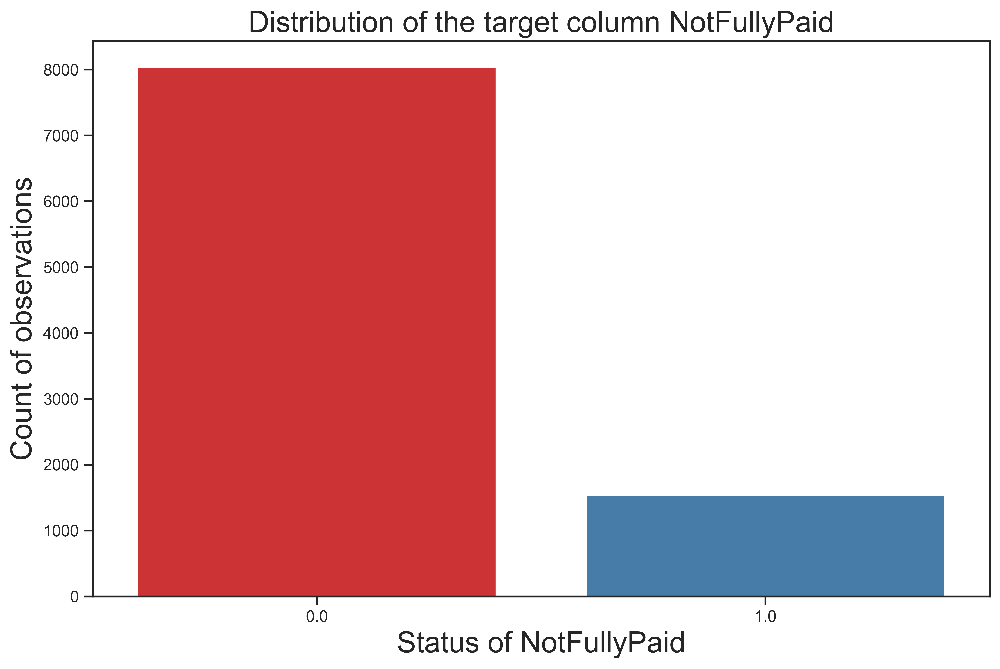

In [41]:
plt.figure(figsize=(11,7), dpi=600)
sns.countplot(x='NotFullyPaid',data=loans,palette='Set1')
plt.title("Distribution of the target column NotFullyPaid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Status of NotFullyPaid", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofthetargetcolumnNotFullyPaid.png",dpi=600)

**As we can see from the figure above we were dealing with unbalance data.**

# Q6:
**Did we analyze the CreditPolicy column of the dataframe?**

In [42]:
CP=loans['CreditPolicy'].value_counts()
CP

1.0    7700
0.0    1868
Name: CreditPolicy, dtype: int64

In [43]:
from scipy.stats import chi2_contingency

table1 = pd.crosstab(loans['CreditPolicy'],loans['NotFullyPaid'], margins=True)
table1


NotFullyPaid,0.0,1.0,All
CreditPolicy,,,
0.0,1349,519,1868
1.0,6688,1012,7700
All,8037,1531,9568


In [44]:
# This code was provided by Mr Hamid in our class

def chi_square(c1,c2):
    chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(loans[c1],loans[c2],margins = False))
    # We have to make sure margins = False

    print(exp_val)
    print('\nChi-square is : %f'%chi_2, '\n\np_value is : %f'%p_val, '\n\ndegree of freedom is : %i'%dof)

    if p_val < 0.05:# consider significan level is 5%
        print("\nThere is some correlation between the two variables at significance level 0.05")
    else:
        print("\nThere is no correlation between the two variables")

In [45]:
chi_square('CreditPolicy','NotFullyPaid')

[[1569.09657191  298.90342809]
 [6467.90342809 1232.09657191]]

Chi-square is : 238.659022 

p_value is : 0.000000 

degree of freedom is : 1

There is some correlation between the two variables at significance level 0.05


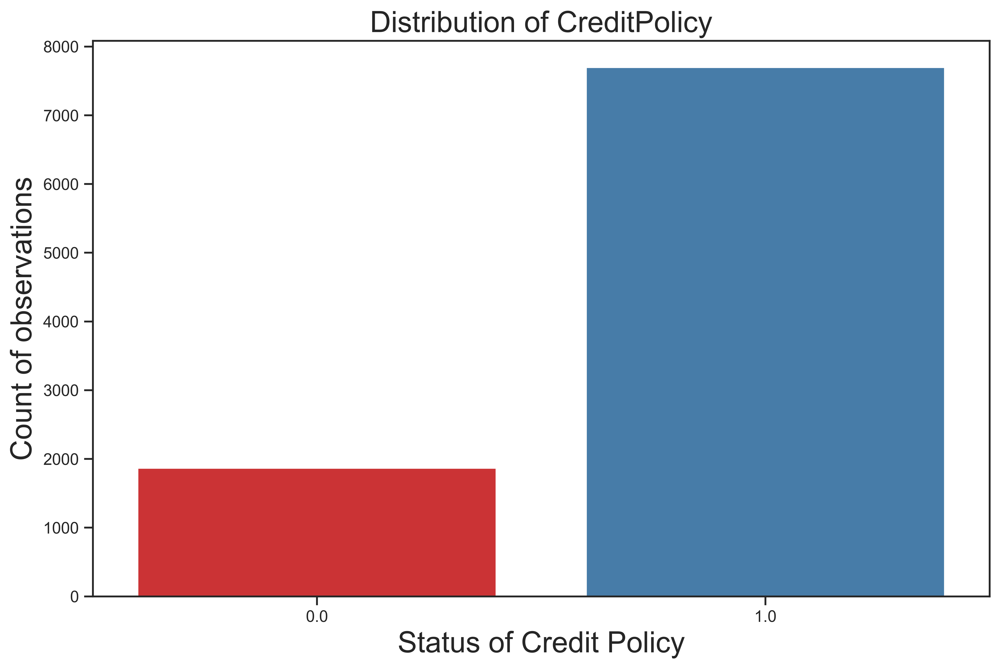

In [46]:
plt.figure(figsize=(11,7), dpi=600)
sns.countplot(x='CreditPolicy',data=loans,palette='Set1')
plt.title("Distribution of CreditPolicy", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Status of Credit Policy", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofCreditPolicy.png",dpi=600)

**We can see that most of the borrowers meet the credit underwriting criteria of LendingClub.com.**

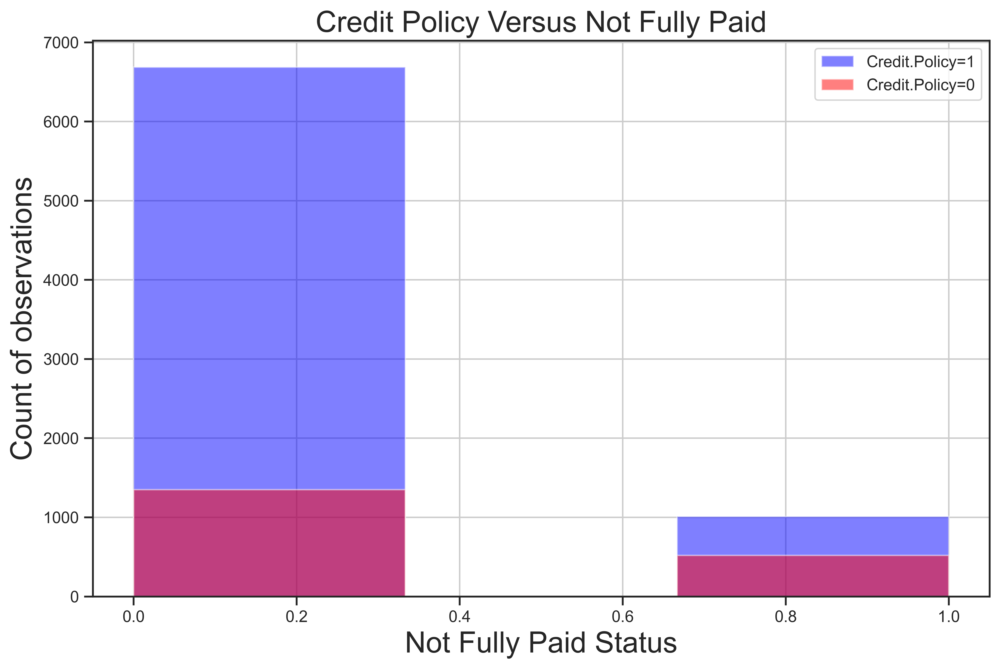

In [47]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['CreditPolicy']==1]['NotFullyPaid'].hist(alpha=0.5,color='blue',
                                              bins=3,label='Credit.Policy=1')
loans[loans['CreditPolicy']==0]['NotFullyPaid'].hist(alpha=0.5,color='red',
                                              bins=3,label='Credit.Policy=0')
plt.legend()
plt.title("Credit Policy Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Not Fully Paid Status", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofCreditPolicyVNotFullyPaid.png",dpi=600)

# Q7:
**Did we analyze the Purpose column of the dataframe?**

In [48]:
PP=loans['Purpose'].value_counts()
PP

debt_consolidation    3960
all_other             2324
credit_card           1259
home_improvement       629
small_business         618
major_purchase         436
educational            342
Name: Purpose, dtype: int64

In [49]:
table2 = pd.crosstab(loans['Purpose'],loans['NotFullyPaid'], margins=True)
table2

NotFullyPaid,0.0,1.0,All
Purpose,,,
all_other,1938,386,2324
credit_card,1113,146,1259
debt_consolidation,3358,602,3960
educational,273,69,342
home_improvement,522,107,629
major_purchase,387,49,436
small_business,446,172,618
All,8037,1531,9568


In [50]:
chi_square('Purpose','NotFullyPaid')

[[1952.13085284  371.86914716]
 [1057.54420987  201.45579013]
 [3326.35033445  633.64966555]
 [ 287.2757107    54.7242893 ]
 [ 528.3521112   100.6478888 ]
 [ 366.23453177   69.76546823]
 [ 519.11224916   98.88775084]]

Chi-square is : 97.316184 

p_value is : 0.000000 

degree of freedom is : 6

There is some correlation between the two variables at significance level 0.05


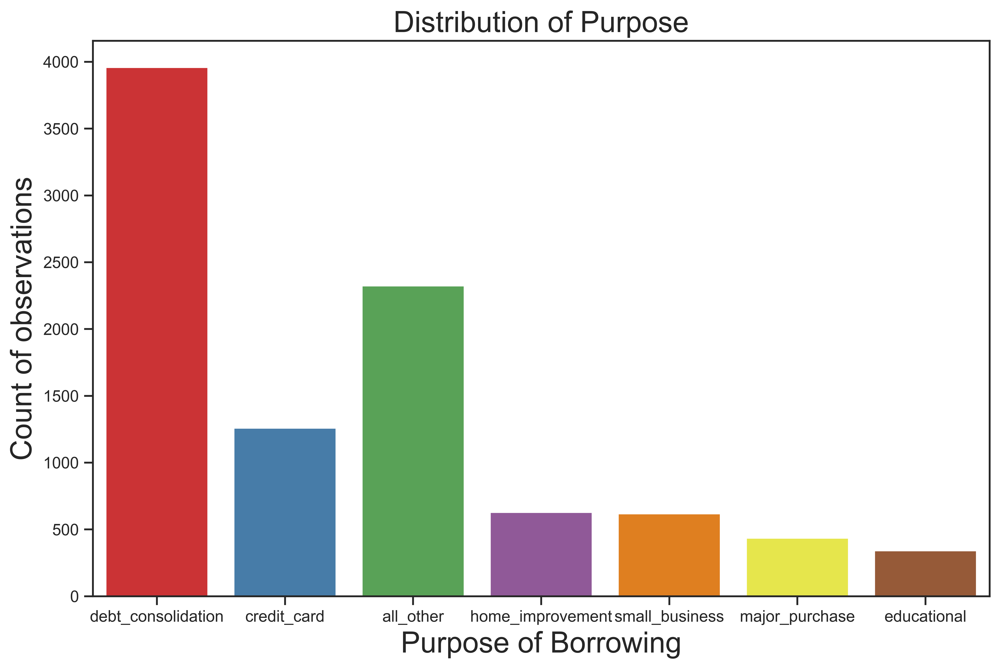

In [51]:
plt.figure(figsize=(11,7), dpi=600)
sns.countplot(x='Purpose',data=loans,palette='Set1')
plt.title("Distribution of Purpose", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Purpose of Borrowing", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofStatusofPurpose.png",dpi=600)

**It is clear that debt consolidation was by far the main reason of borrowing.**

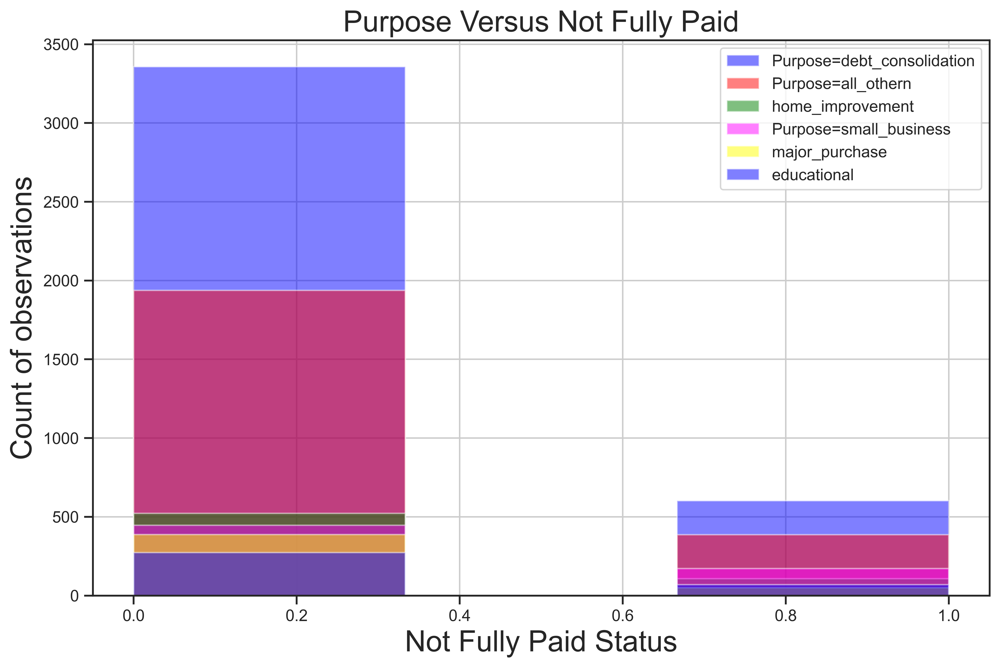

In [52]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['Purpose']=='debt_consolidation']['NotFullyPaid'].hist(alpha=0.5,color='blue',
                                              bins=3,label='Purpose=debt_consolidation')
loans[loans['Purpose']=='all_other']['NotFullyPaid'].hist(alpha=0.5,color='red',
                                              bins=3,label='Purpose=all_othern')
loans[loans['Purpose']=='home_improvement']['NotFullyPaid'].hist(alpha=0.5,color='green',
                                              bins=3,label='home_improvement')
loans[loans['Purpose']=='small_business']['NotFullyPaid'].hist(alpha=0.5,color='magenta',
                                              bins=3,label='Purpose=small_business')
loans[loans['Purpose']=='major_purchase']['NotFullyPaid'].hist(alpha=0.5,color='yellow',
                                              bins=3,label='major_purchase')
loans[loans['Purpose']=='educational']['NotFullyPaid'].hist(alpha=0.5,color='blue',
                                              bins=3,label='educational')
plt.legend()
plt.title("Purpose Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Not Fully Paid Status", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofPurposeVNotFullyPaid.png",dpi=600)


# Q8:
**Did we analyze the InterestRate column of the dataframe?**

In [53]:
IR=loans['InterestRate'].describe()
IR

count    9568.000000
mean        0.122644
std         0.026850
min         0.060000
25%         0.103900
50%         0.122100
75%         0.140700
max         0.216400
Name: InterestRate, dtype: float64

In [54]:
from scipy.stats import ttest_ind
ttest_ind(loans['InterestRate'],loans['NotFullyPaid'])

Ttest_indResult(statistic=-9.94291736213115, pvalue=3.083166954029472e-23)

There is some correlation between the two variables at significance level 0.05

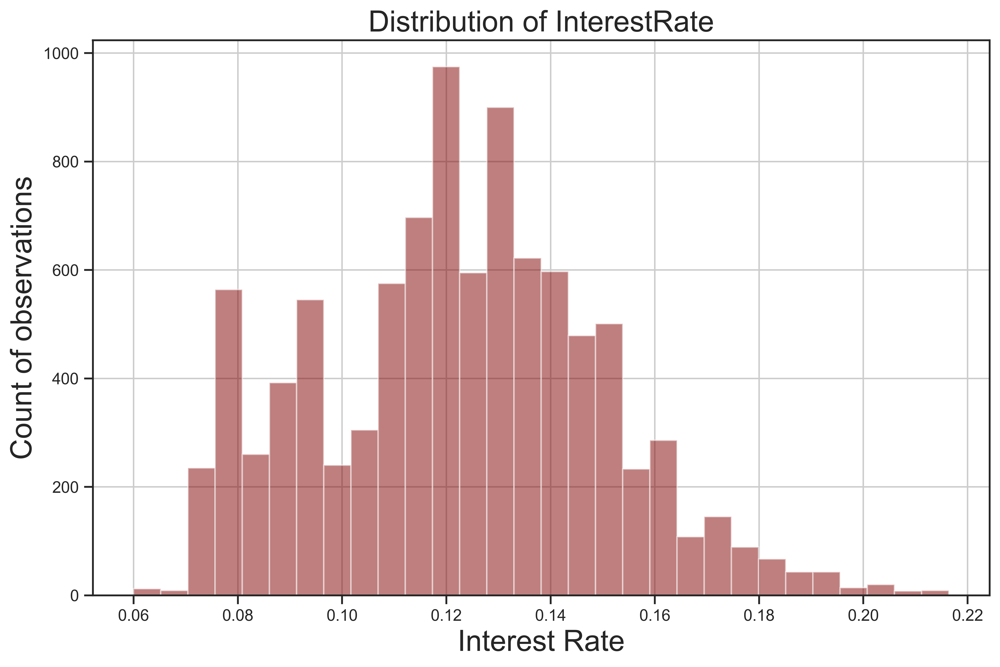

In [55]:
plt.figure(figsize=(11,7), dpi=600)
loans['InterestRate'].hist(alpha=0.5,color='maroon',
                                              bins=30)
plt.title("Distribution of InterestRate", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Interest Rate", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInterestRate.png",dpi=600)

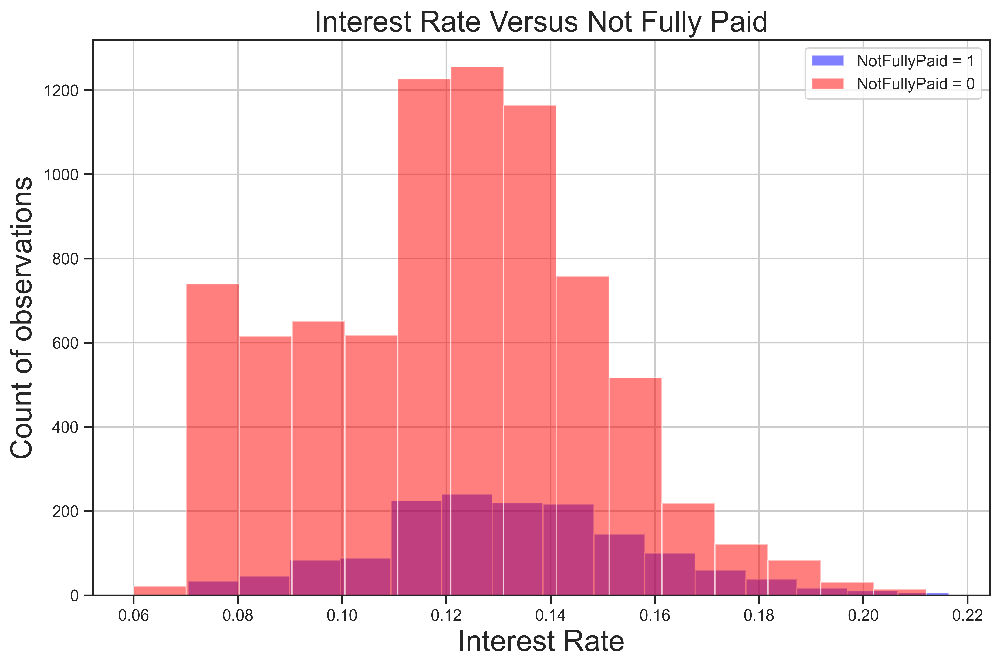

In [56]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['InterestRate'].hist(alpha=0.5,color='blue',
                                              bins=15,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['InterestRate'].hist(alpha=0.5,color='red',
                                              bins=15,label='NotFullyPaid = 0')
plt.legend()
plt.title("Interest Rate Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Interest Rate", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInterestVNotFullyPaid.png",dpi=600)


# Q9:
**Did we analyze the Installment column of the dataframe?**

In [57]:
IST=loans['Installment'].describe()
IST

count    9568.000000
mean      319.021305
std       207.052703
min        15.670000
25%       163.770000
50%       268.950000
75%       432.282500
max       940.140000
Name: Installment, dtype: float64

In [58]:
ttest_ind(loans['Installment'],loans['NotFullyPaid'])

Ttest_indResult(statistic=150.63670239322266, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

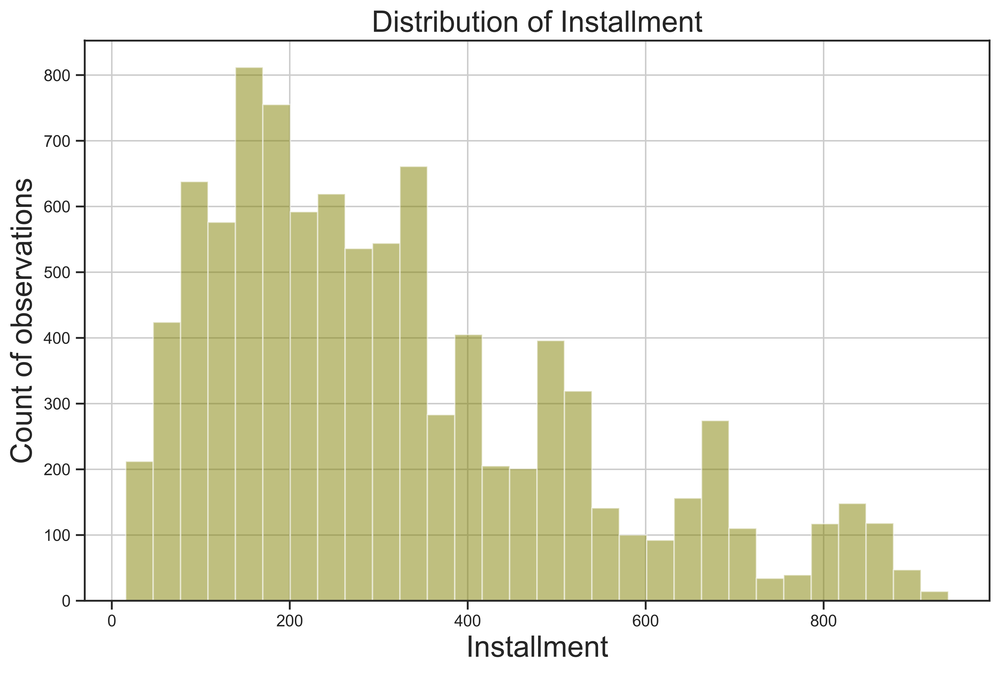

In [59]:
plt.figure(figsize=(11,7), dpi=600)
loans['Installment'].hist(alpha=0.5,color='olive',
                                              bins=30)
plt.title("Distribution of Installment", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Installment", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInstallment.png",dpi=600)

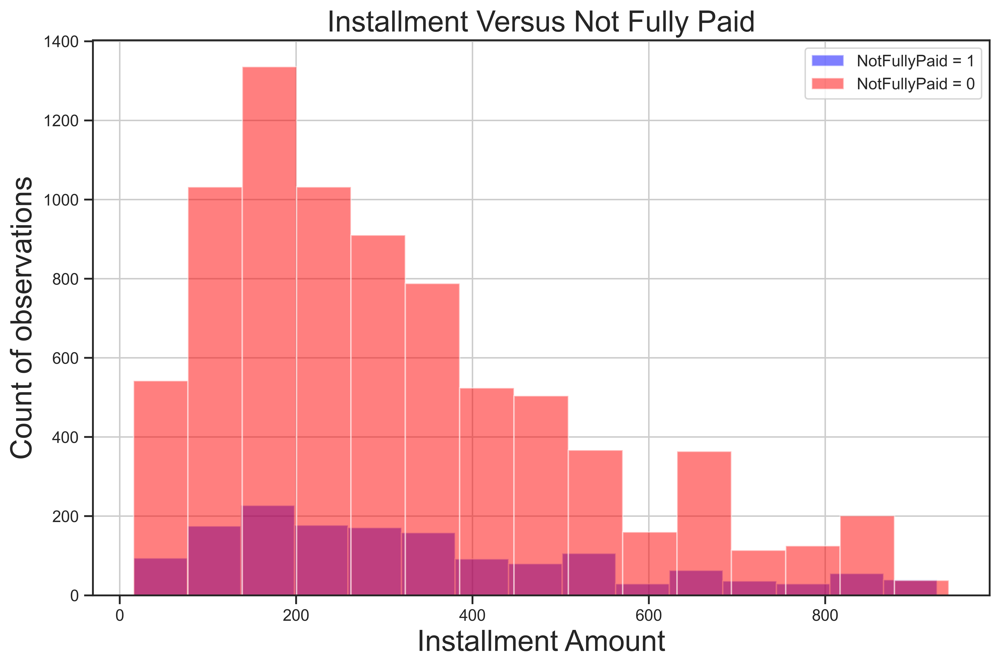

In [60]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['Installment'].hist(alpha=0.5,color='blue',
                                              bins=15,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['Installment'].hist(alpha=0.5,color='red',
                                              bins=15,label='NotFullyPaid = 0')
plt.legend()
plt.title("Installment Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Installment Amount", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInstallmentVNotFullyPaid.png",dpi=600)

# Q10:
**Did we analyze AnnualIncomeLn column of the dataframe?**

In [61]:
AIL=loans['AnnualIncomeLn'].describe()
AIL

count    9568.000000
mean       10.931854
std         0.614912
min         7.547502
25%        10.558414
50%        10.927987
75%        11.289832
max        14.528354
Name: AnnualIncomeLn, dtype: float64

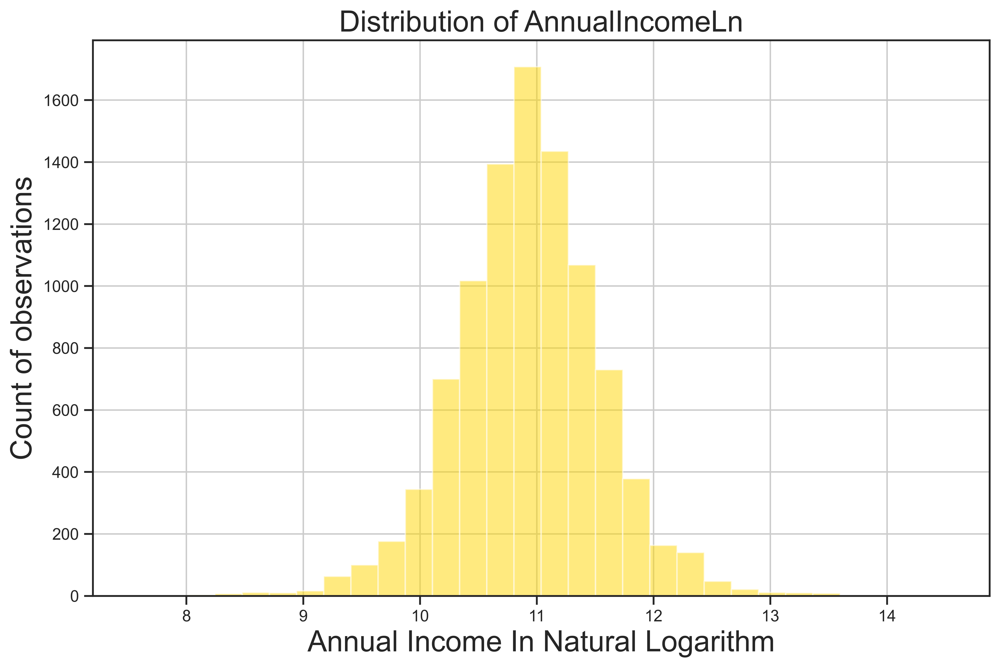

In [62]:
plt.figure(figsize=(11,7), dpi=600)
loans['AnnualIncomeLn'].hist(alpha=0.5,color='gold',
                                              bins=30)
plt.title("Distribution of AnnualIncomeLn", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Annual Income In Natural Logarithm", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofAnnualIncomeLn.png",dpi=600)

In [63]:
ttest_ind(loans['AnnualIncomeLn'],loans['NotFullyPaid'])

Ttest_indResult(statistic=1471.7593957259485, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

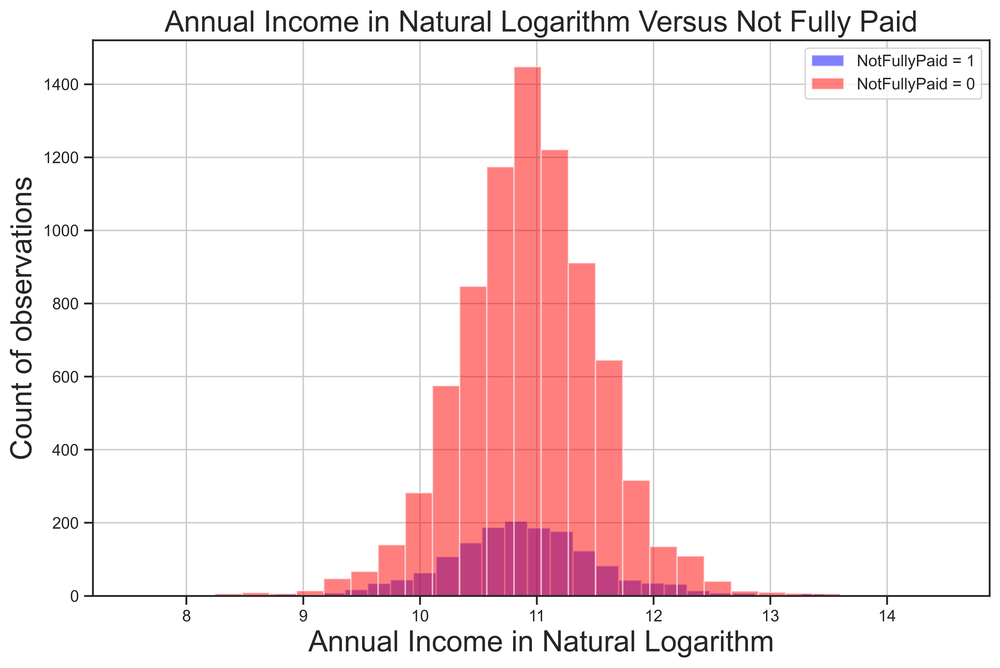

In [64]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['AnnualIncomeLn'].hist(alpha=0.5,color='blue',
                                              bins=30,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['AnnualIncomeLn'].hist(alpha=0.5,color='red',
                                              bins=30,label='NotFullyPaid = 0')
plt.legend()
plt.title("Annual Income in Natural Logarithm Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Annual Income in Natural Logarithm", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofAnnualIncomeLnVNotFullyPaid.png",dpi=600)

# Q11:
**Did we analyze DebtToIncome column of the dataframe?**

In [65]:
DTI=loans['DebtToIncome'].describe()
DTI

count    9568.000000
mean       12.604398
std         6.885845
min         0.000000
25%         7.207500
50%        12.660000
75%        17.950000
max        29.960000
Name: DebtToIncome, dtype: float64

In [66]:
ttest_ind(loans['DebtToIncome'],loans['NotFullyPaid'])

Ttest_indResult(statistic=176.5273597101466, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

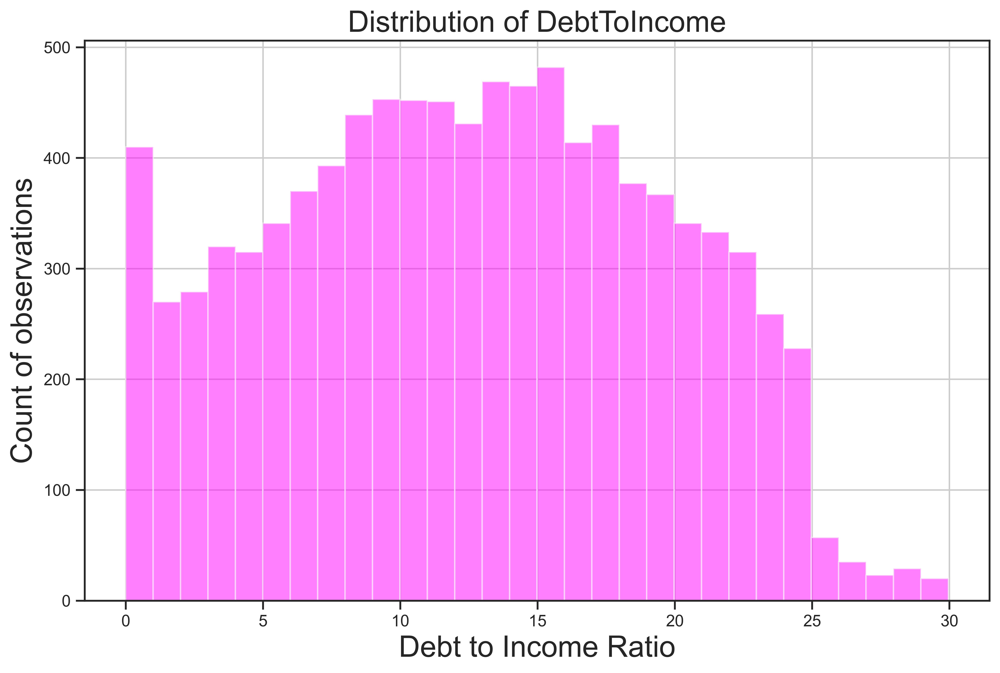

In [67]:
plt.figure(figsize=(11,7), dpi=600)
loans['DebtToIncome'].hist(alpha=0.5,color='magenta',
                                              bins=30)
plt.title("Distribution of DebtToIncome", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Debt to Income Ratio", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDebtToIncome.png",dpi=600)

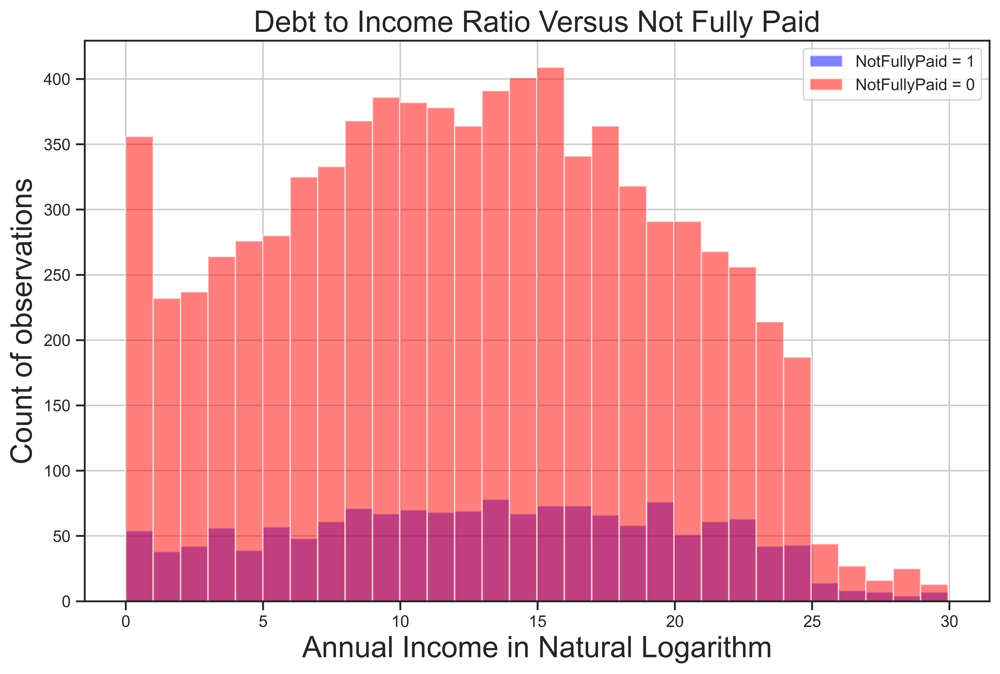

In [68]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['DebtToIncome'].hist(alpha=0.5,color='blue',
                                              bins=30,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['DebtToIncome'].hist(alpha=0.5,color='red',
                                              bins=30,label='NotFullyPaid = 0')
plt.legend()
plt.title("Debt to Income Ratio Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Annual Income in Natural Logarithm", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDebtToIncomeVNotFullyPaid.png",dpi=600)

# Q12:
**Did we analyze FICO.Score column of the dataframe?**

In [69]:
FCS=loans['FICO.Score'].describe()
FCS

count    9568.000000
mean      710.832044
std        37.981188
min       612.000000
25%       682.000000
50%       707.000000
75%       737.000000
max       827.000000
Name: FICO.Score, dtype: float64

In [70]:
ttest_ind(loans['FICO.Score'],loans['NotFullyPaid'])

Ttest_indResult(statistic=1830.1683185318614, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

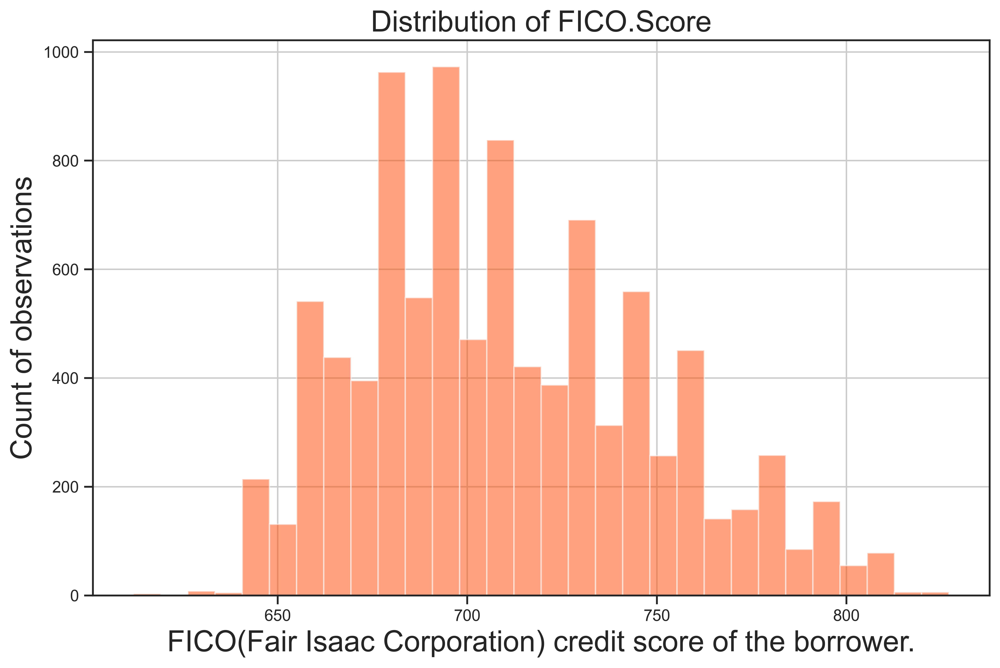

In [71]:
plt.figure(figsize=(11,7), dpi=600)
loans['FICO.Score'].hist(alpha=0.5,color='#FF4500',
                                              bins=30)
plt.title("Distribution of FICO.Score", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("FICO(Fair Isaac Corporation) credit score of the borrower.", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofFICOSCORE.png",dpi=600)

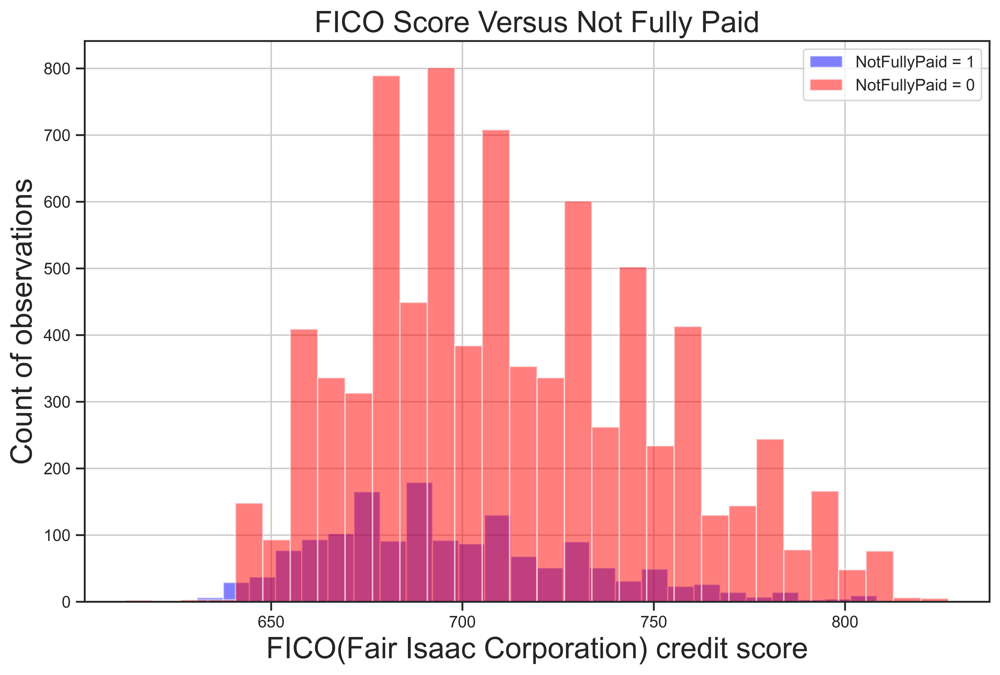

In [72]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['FICO.Score'].hist(alpha=0.5,color='blue',
                                              bins=30,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['FICO.Score'].hist(alpha=0.5,color='red',
                                              bins=30,label='NotFullyPaid = 0')
plt.legend()
plt.title("FICO Score Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("FICO(Fair Isaac Corporation) credit score", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofFICOScoreVNotFullyPaid.png",dpi=600)

# Q12:
**Did we analyze DaysSinceSubscription column of the dataframe?**

In [73]:
DSS=loans['DaysSinceSubscription'].describe()
DSS

count     9568.000000
mean      4559.426038
std       2496.307691
min        178.958333
25%       2819.958333
50%       4139.958333
75%       5730.000000
max      17639.958330
Name: DaysSinceSubscription, dtype: float64

In [74]:
ttest_ind(loans['DaysSinceSubscription'],loans['NotFullyPaid'])

Ttest_indResult(statistic=178.65180036867943, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

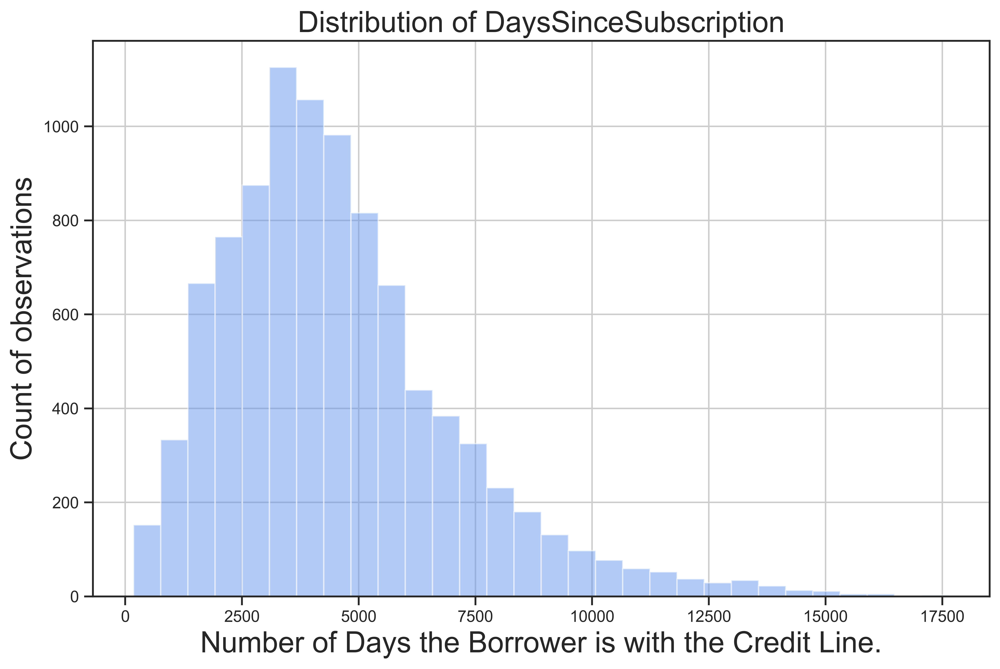

In [75]:
plt.figure(figsize=(11,7), dpi=600)
loans['DaysSinceSubscription'].hist(alpha=0.5,color='#6495ED',
                                              bins=30)
plt.title("Distribution of DaysSinceSubscription", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Number of Days the Borrower is with the Credit Line.", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDaysSinceSubscription.png",dpi=600)

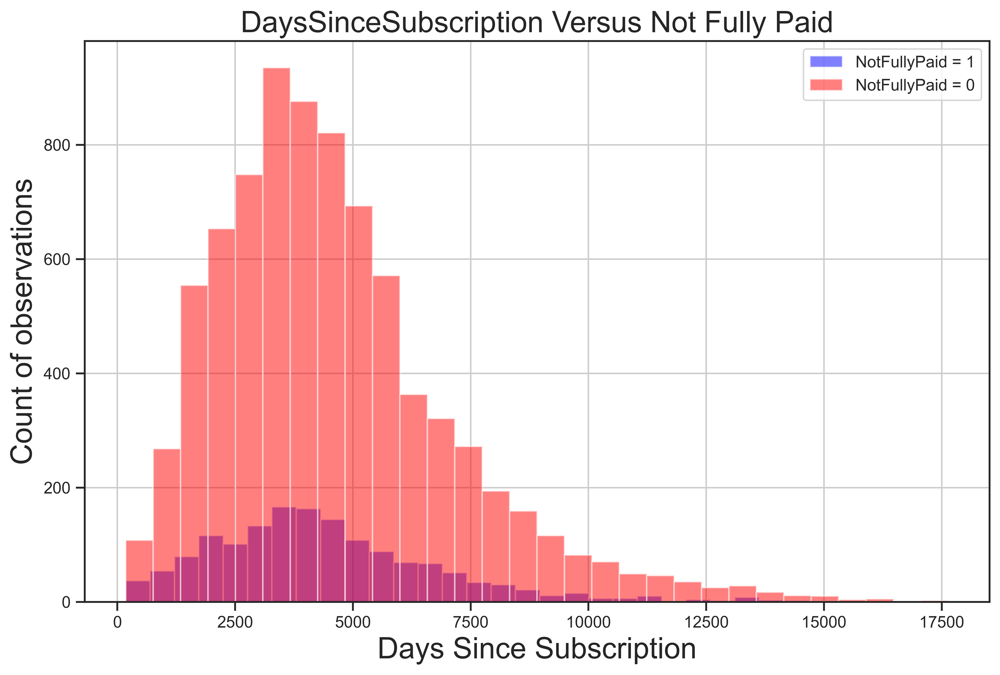

In [76]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['DaysSinceSubscription'].hist(alpha=0.5,color='blue',
                                              bins=30,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['DaysSinceSubscription'].hist(alpha=0.5,color='red',
                                              bins=30,label='NotFullyPaid = 0')
plt.legend()
plt.title("DaysSinceSubscription Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Days Since Subscription", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDaysSinceSubscriptionVNotFullyPaid.png",dpi=600)

# Q13:
**Did we analyze RevolvingBalance column of the dataframe?**

In [77]:
RVB=loans['RevolvingBalance'].describe()
RVB

count    9.568000e+03
mean     1.691402e+04
std      3.377049e+04
min      0.000000e+00
25%      3.184750e+03
50%      8.593000e+03
75%      1.824450e+04
max      1.207359e+06
Name: RevolvingBalance, dtype: float64

In [78]:
ttest_ind(loans['RevolvingBalance'],loans['NotFullyPaid'])

Ttest_indResult(statistic=48.99095349989636, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

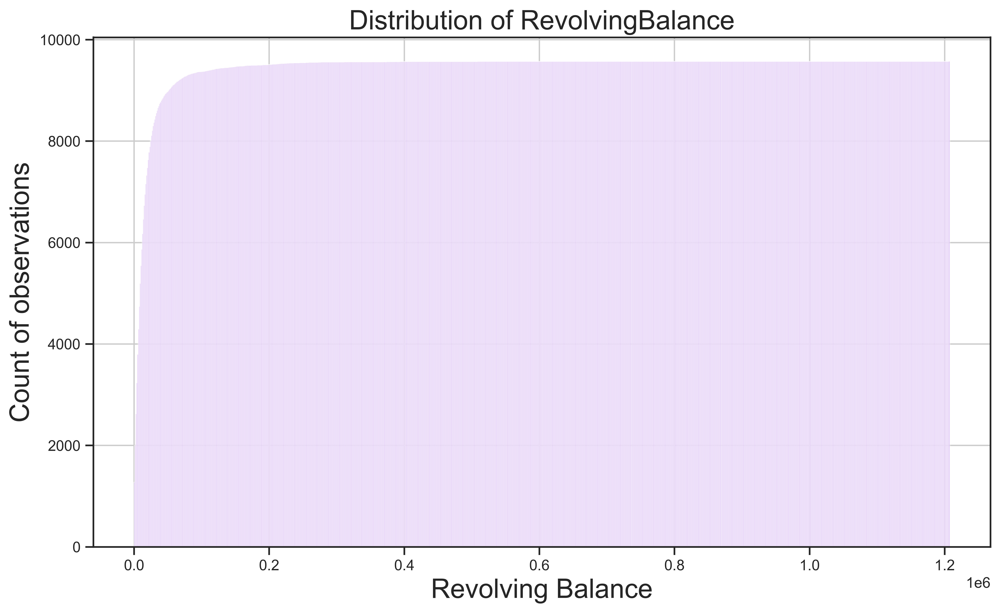

In [79]:
plt.figure(figsize=(12,7), dpi=600)
loans['RevolvingBalance'].hist(alpha=0.5,color='#8A2BE2',
                                              bins=1000, cumulative=True )
plt.title("Distribution of RevolvingBalance", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Revolving Balance", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofRevolvingBalance.png",dpi=600)

# Q14:
**Did we analyze DebtToLimitRatio column of the dataframe?**


In [80]:
DTL=loans['DebtToLimitRatio'].describe()
DTL

count    9568.00000
mean       46.79911
std        29.02057
min         0.00000
25%        22.60000
50%        46.30000
75%        70.90000
max       119.00000
Name: DebtToLimitRatio, dtype: float64

In [81]:
ttest_ind(loans['DebtToLimitRatio'],loans['NotFullyPaid'])

Ttest_indResult(statistic=157.18826651260008, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

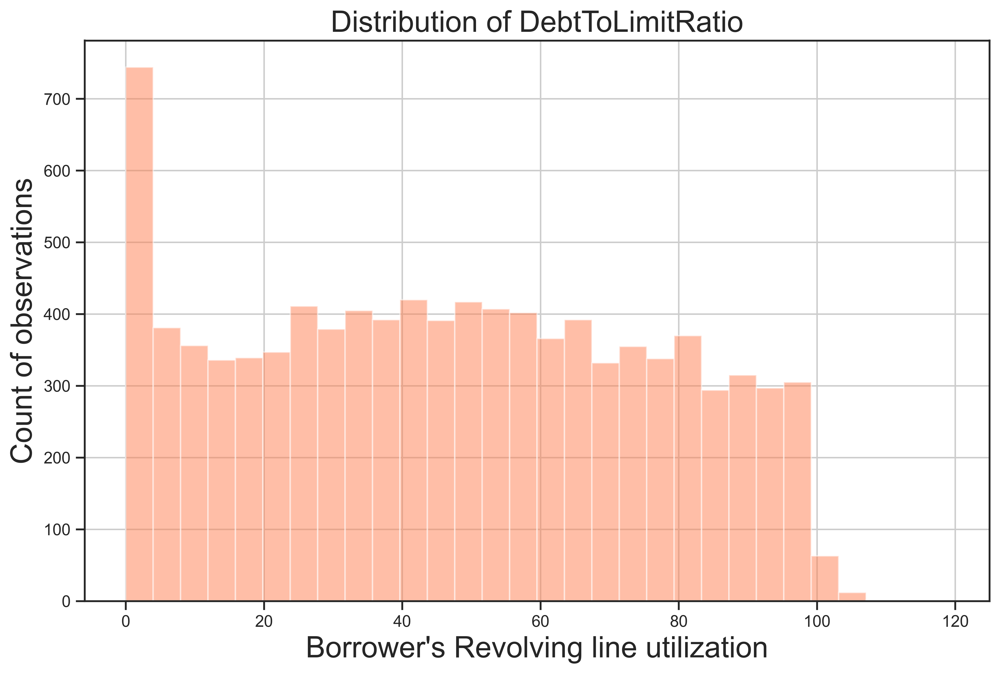

In [82]:
plt.figure(figsize=(11,7), dpi=600)
loans['DebtToLimitRatio'].hist(alpha=0.5,color='coral',
                                              bins=30)
plt.title("Distribution of DebtToLimitRatio", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Borrower's Revolving line utilization", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDebtToLimitRatio.png",dpi=600)

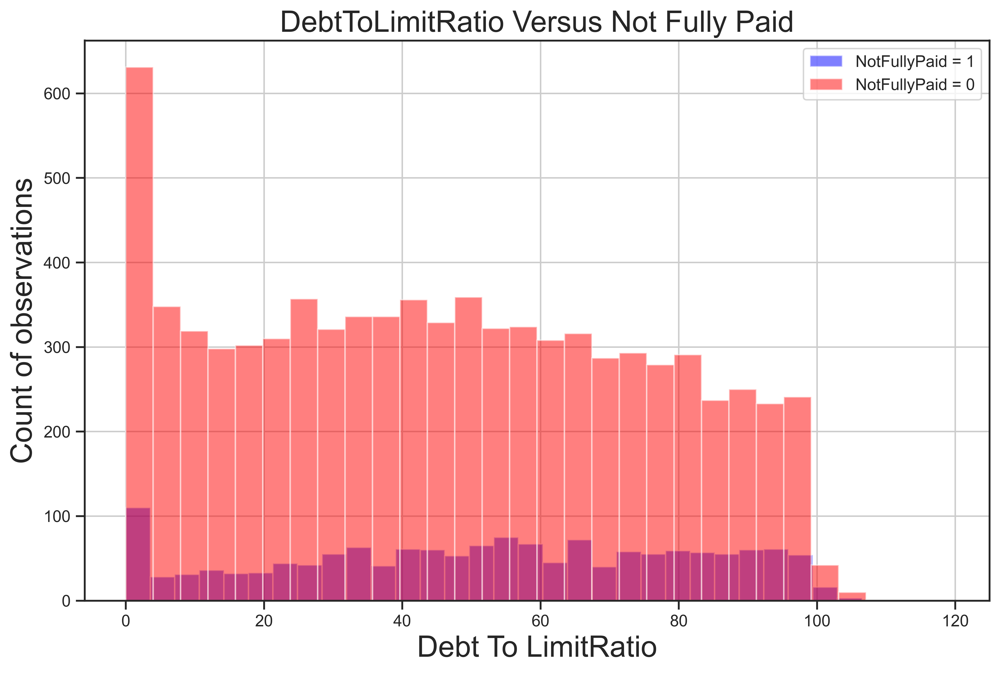

In [83]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['DebtToLimitRatio'].hist(alpha=0.5,color='blue',
                                              bins=30,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['DebtToLimitRatio'].hist(alpha=0.5,color='red',
                                              bins=30,label='NotFullyPaid = 0')
plt.legend()
plt.title("DebtToLimitRatio Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Debt To LimitRatio", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDaysDebtToLimitRatioVNotFullyPaid.png",dpi=600)

# Q15:
**Did we analyze InquirySixMonths column of the dataframe?**

In [84]:
ISM=loans['InquirySixMonths'].describe()
ISM

count    9568.000000
mean        1.577864
std         2.201038
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max        33.000000
Name: InquirySixMonths, dtype: float64

In [85]:
ttest_ind(loans['InquirySixMonths'],loans['NotFullyPaid'])

Ttest_indResult(statistic=62.154207595689705, pvalue=0.0)

There is some correlation between the two variables at significance level 0.05

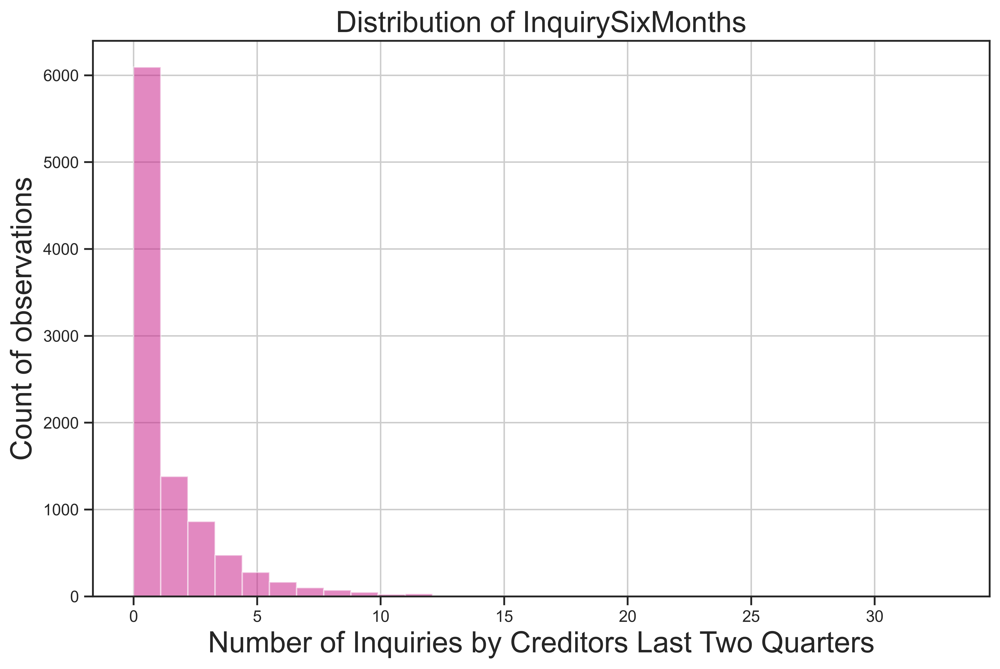

In [86]:
plt.figure(figsize=(11,7), dpi=600)
loans['InquirySixMonths'].hist(alpha=0.5,color='#C71585',
                                              bins=30)
plt.title("Distribution of InquirySixMonths", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Number of Inquiries by Creditors Last Two Quarters", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInquirySixMonths.png",dpi=600)

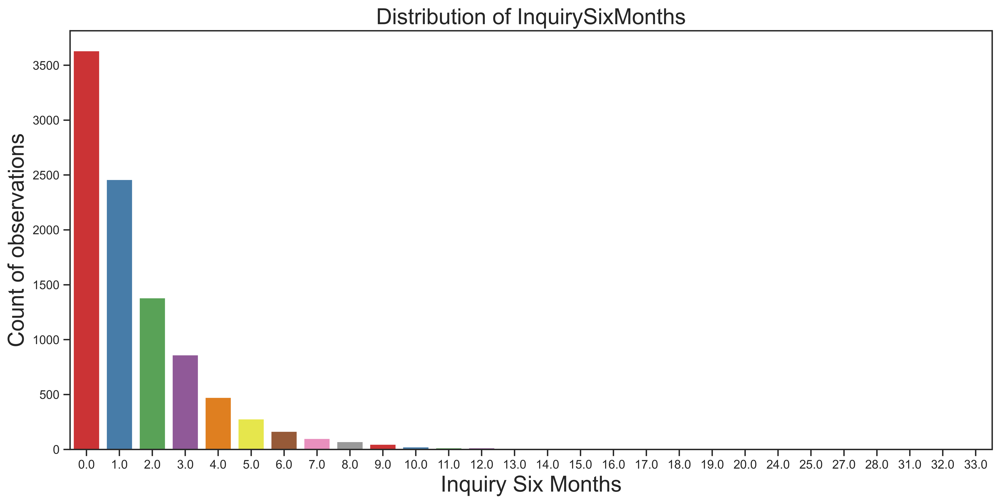

In [87]:
plt.figure(figsize=(15,7), dpi=600)
sns.countplot(x='InquirySixMonths',data=loans,palette='Set1')
plt.title("Distribution of InquirySixMonths", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Inquiry Six Months", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInquirySixMonthsBar.png",dpi=600)

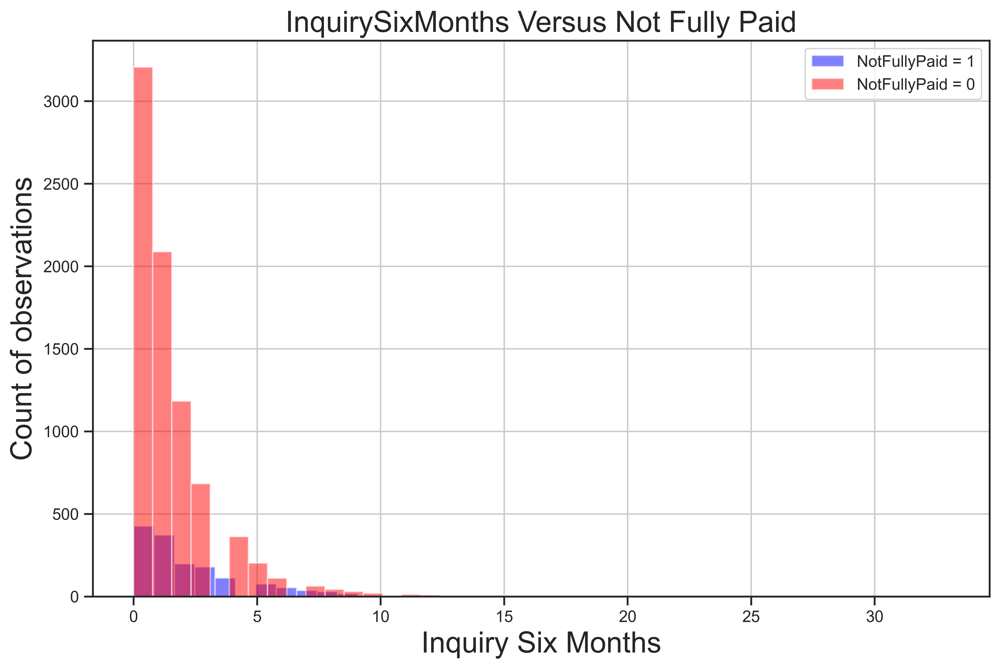

In [88]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['InquirySixMonths'].hist(alpha=0.5,color='blue',
                                              bins=40,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['InquirySixMonths'].hist(alpha=0.5,color='red',
                                              bins=40,label='NotFullyPaid = 0')
plt.legend()
plt.title("InquirySixMonths Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Inquiry Six Months", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofInquirySixMonthsVNotFullyPaid.png",dpi=600)

# Q16:
**Did we analyze DelayedPaymentsTwoYears column of the dataframe?**

In [89]:
DPTY=loans['DelayedPaymentsTwoYears'].value_counts()
DPTY

0.0     8448
1.0      832
2.0      192
3.0       65
4.0       19
5.0        6
6.0        2
11.0       1
13.0       1
8.0        1
7.0        1
Name: DelayedPaymentsTwoYears, dtype: int64

In [90]:
table3 = pd.crosstab(loans['DelayedPaymentsTwoYears'],loans['NotFullyPaid'], margins=True)
table3


NotFullyPaid,0.0,1.0,All
DelayedPaymentsTwoYears,,,
0.0,7113,1335,8448
1.0,687,145,832
2.0,158,34,192
3.0,52,13,65
4.0,15,4,19
5.0,6,0,6
6.0,2,0,2
7.0,1,0,1
8.0,1,0,1


In [91]:
chi_square('DelayedPaymentsTwoYears','NotFullyPaid')


[[7.09621405e+03 1.35178595e+03]
 [6.98869565e+02 1.33130435e+02]
 [1.61277592e+02 3.07224080e+01]
 [5.45991848e+01 1.04008152e+01]
 [1.59597617e+01 3.04023829e+00]
 [5.03992475e+00 9.60075251e-01]
 [1.67997492e+00 3.20025084e-01]
 [8.39987458e-01 1.60012542e-01]
 [8.39987458e-01 1.60012542e-01]
 [8.39987458e-01 1.60012542e-01]
 [8.39987458e-01 1.60012542e-01]]

Chi-square is : 5.344180 

p_value is : 0.867033 

degree of freedom is : 10

There is no correlation between the two variables


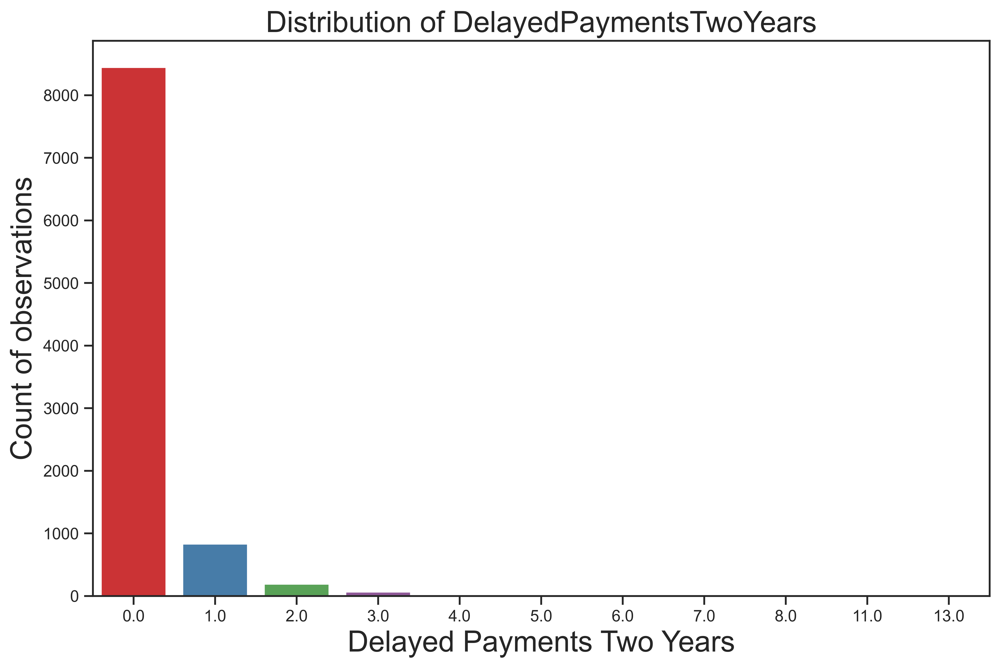

In [92]:
plt.figure(figsize=(11,7), dpi=600)
sns.countplot(x='DelayedPaymentsTwoYears',data=loans,palette='Set1')
plt.title("Distribution of DelayedPaymentsTwoYears", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Delayed Payments Two Years", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDelayedPaymentsTwoYears.png",dpi=600)

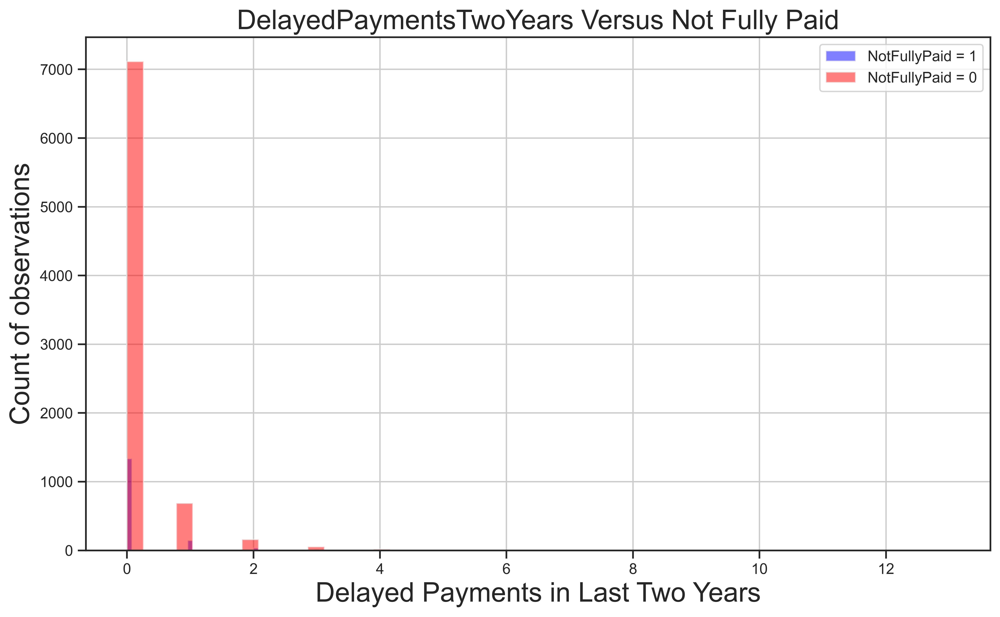

In [93]:
plt.figure(figsize=(12,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['DelayedPaymentsTwoYears'].hist(alpha=0.5,color='blue',
                                              bins=50,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['DelayedPaymentsTwoYears'].hist(alpha=0.5,color='red',
                                              bins=50,label='NotFullyPaid = 0')
plt.legend()
plt.title("DelayedPaymentsTwoYears Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Delayed Payments in Last Two Years", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDelayedPaymentsTwoYearsVNotFullyPaid.png",dpi=600)

# Q17:
**Did we analyze DerogatoryPublicRecords column of the dataframe?**

In [94]:
DPR=loans['DerogatoryPublicRecords'].value_counts()
DPR

0.0    9010
1.0     532
2.0      19
3.0       5
5.0       1
4.0       1
Name: DerogatoryPublicRecords, dtype: int64

In [95]:
table4 = pd.crosstab(loans['DerogatoryPublicRecords'],loans['NotFullyPaid'], margins=True)
table4

NotFullyPaid,0.0,1.0,All
DerogatoryPublicRecords,,,
0.0,7617,1393,9010
1.0,396,136,532
2.0,17,2,19
3.0,5,0,5
4.0,1,0,1
5.0,1,0,1
All,8037,1531,9568


In [96]:
chi_square('DerogatoryPublicRecords','NotFullyPaid')

[[7.56828700e+03 1.44171300e+03]
 [4.46873328e+02 8.51266722e+01]
 [1.59597617e+01 3.04023829e+00]
 [4.19993729e+00 8.00062709e-01]
 [8.39987458e-01 1.60012542e-01]
 [8.39987458e-01 1.60012542e-01]]

Chi-square is : 39.911090 

p_value is : 0.000000 

degree of freedom is : 5

There is some correlation between the two variables at significance level 0.05


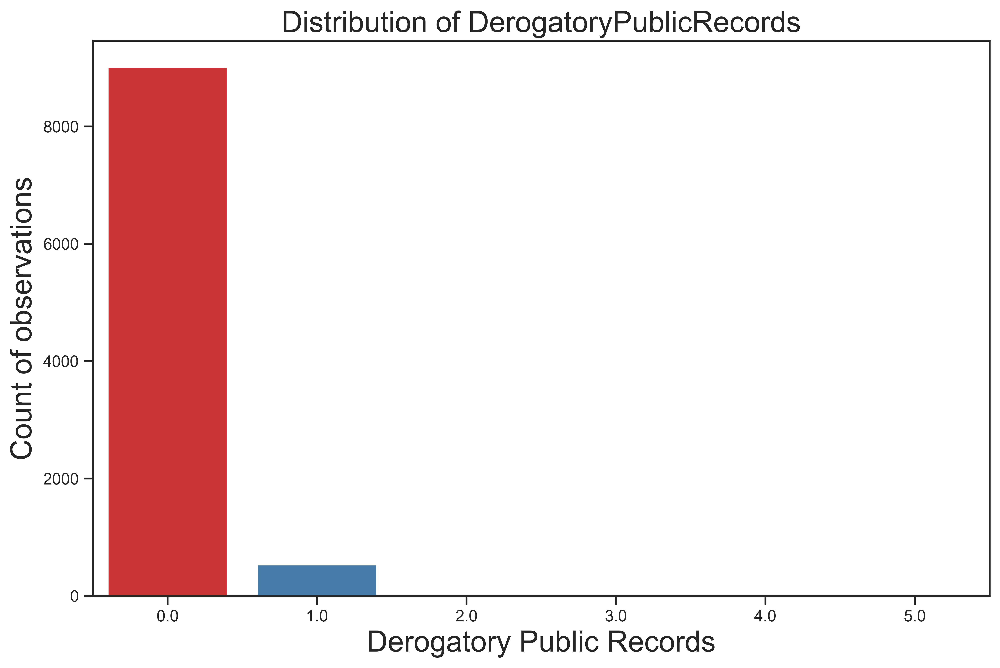

In [97]:
plt.figure(figsize=(11,7), dpi=600)
sns.countplot(x='DerogatoryPublicRecords',data=loans,palette='Set1')
plt.title("Distribution of DerogatoryPublicRecords", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Derogatory Public Records", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDerogatoryPublicRecords.png",dpi=600)

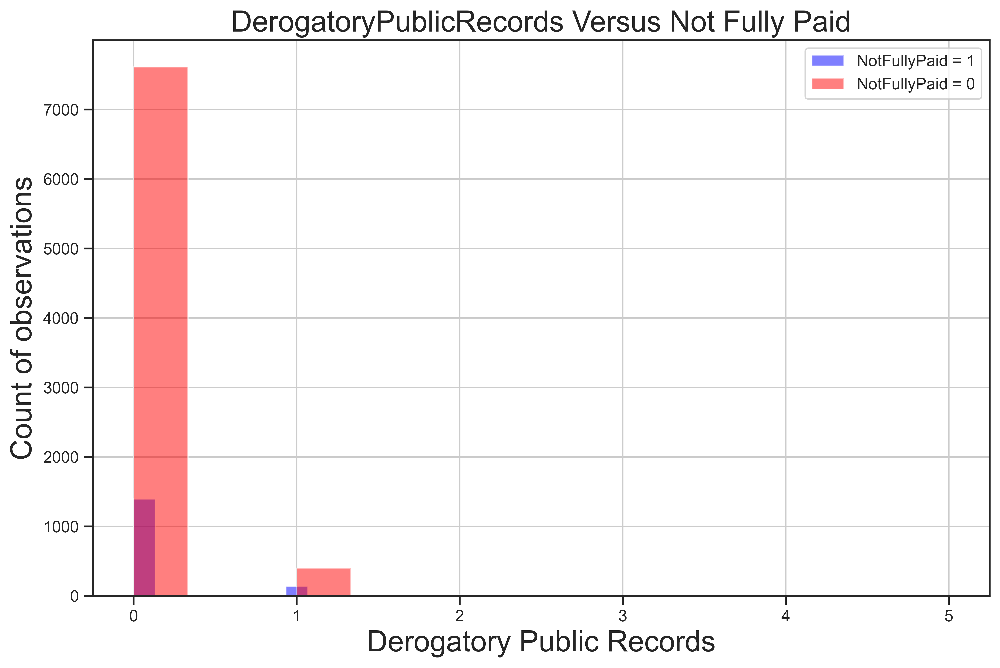

In [98]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['NotFullyPaid']== 1 ]['DerogatoryPublicRecords'].hist(alpha=0.5,color='blue',
                                              bins=15,label='NotFullyPaid = 1')
loans[loans['NotFullyPaid']== 0 ]['DerogatoryPublicRecords'].hist(alpha=0.5,color='red',
                                              bins=15,label='NotFullyPaid = 0')
plt.legend()
plt.title("DerogatoryPublicRecords Versus Not Fully Paid", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("Derogatory Public Records", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofDerogatoryPublicRecordsVNotFullyPaid.png",dpi=600)

# Q18:
**Did we analyze CreditScore and FICO Score columns of the dataframe?**

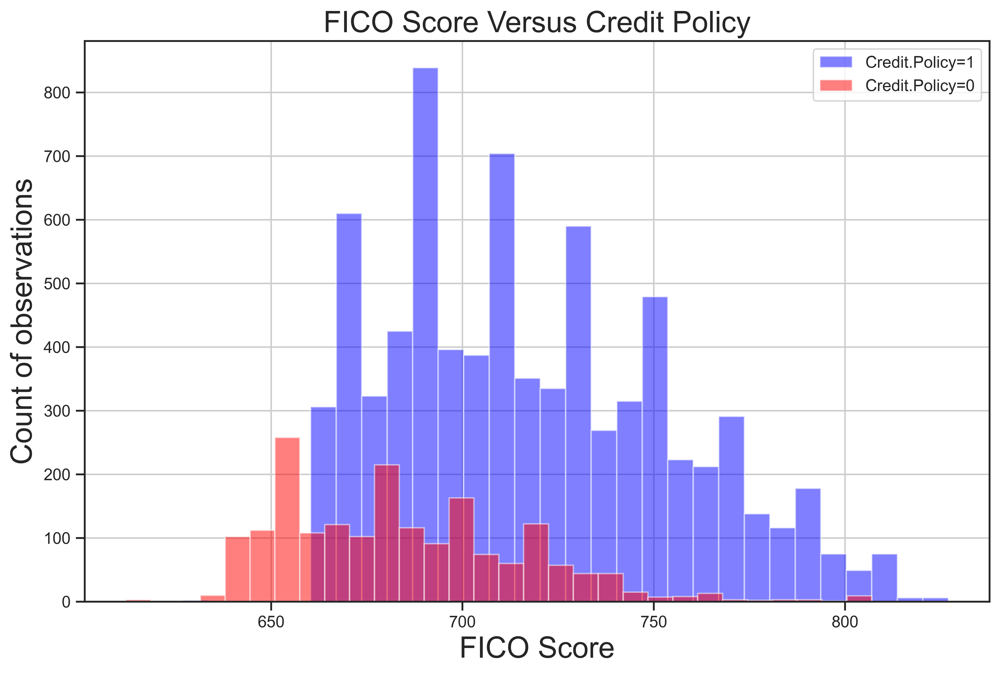

In [99]:
plt.figure(figsize=(11,7), dpi=600)
loans[loans['CreditPolicy']==1]['FICO.Score'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Credit.Policy=1')
loans[loans['CreditPolicy']==0]['FICO.Score'].hist(alpha=0.5,color='red',
                                              bins=30,label='Credit.Policy=0')
plt.legend()
plt.title("FICO Score Versus Credit Policy", fontsize=20)
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel("FICO Score", fontsize=20)
plt.ylabel("Count of observations", fontsize=20)
plt.savefig("DistributionofFICOScoreVCreditPolicy.png",dpi=600)

# Q19:
**Did we changed the categorical features in to numeric ones?**

# Categorical Features
We notice that the Purpose column is categorical one.

That means we need to transform this column using dummy variables so that sklearn will be able to understand them. We performed this step using pd.get_dummies.



In [100]:
final_data = pd.get_dummies(loans,columns=['Purpose'],drop_first=True)

In [101]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9568 entries, 0 to 9619
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CreditPolicy                9568 non-null   float64
 1   InterestRate                9568 non-null   float64
 2   Installment                 9568 non-null   float64
 3   AnnualIncomeLn              9568 non-null   float64
 4   DebtToIncome                9568 non-null   float64
 5   FICO.Score                  9568 non-null   float64
 6   DaysSinceSubscription       9568 non-null   float64
 7   RevolvingBalance            9568 non-null   float64
 8   DebtToLimitRatio            9568 non-null   float64
 9   InquirySixMonths            9568 non-null   float64
 10  DelayedPaymentsTwoYears     9568 non-null   float64
 11  DerogatoryPublicRecords     9568 non-null   float64
 12  NotFullyPaid                9568 non-null   float64
 13  Purpose_credit_card         9568 

In [102]:
final_data.head(5)

,CreditPolicy,InterestRate,Installment,AnnualIncomeLn,DebtToIncome,FICO.Score,DaysSinceSubscription,RevolvingBalance,DebtToLimitRatio,InquirySixMonths,DelayedPaymentsTwoYears,DerogatoryPublicRecords,NotFullyPaid,Purpose_credit_card,Purpose_debt_consolidation,Purpose_educational,Purpose_home_improvement,Purpose_major_purchase,Purpose_small_business
0,1.0,0.1189,829.10,11.350407,19.48,737.0,5639.958333,28854.0,52.1,0.0,0.0,0.0,0.0,0,1,0,0,0,0
1,1.0,0.1071,228.22,11.082143,14.29,707.0,2760.000000,33623.0,76.7,0.0,0.0,0.0,0.0,1,0,0,0,0,0
2,1.0,0.1357,366.86,10.373491,11.63,682.0,4710.000000,3511.0,25.6,1.0,0.0,0.0,0.0,0,1,0,0,0,0
3,1.0,0.1008,162.34,11.350407,8.10,712.0,2699.958333,33667.0,73.2,1.0,0.0,0.0,0.0,0,1,0,0,0,0
4,1.0,0.1426,102.92,11.299732,14.97,667.0,4066.000000,4740.0,39.5,0.0,1.0,0.0,0.0,1,0,0,0,0,0


# Q20:
**Did we try the use case of our cleaned data after EDA?**

**We attempted to work on bulding simple Machine Learning Models with Logistic Regression, 
Decision Tree and Randome Forest algorithms and it was packaged in a package.**

# Q21:
**Did we create any package for using in the project?**

**Actually, we created a package to contain our Machine Learning Models inside the corresponding
module and to get evaluations of the models from the module and its methods.**

# Created a package for Creating Model and Comparison
**I created one package with a view to building Logistic Regression, Decision Tree and Random Forest models and then I also compared the models using this package. I designed in such a way that I have to input the dataframe and the target column only as arguments to the module and its functions.**

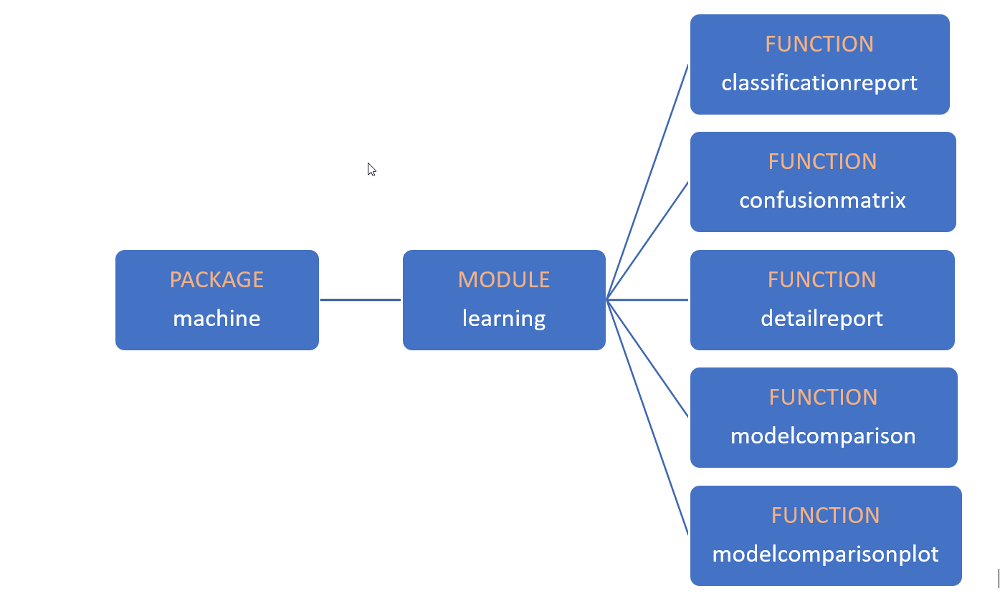

**We put the package folder in the default location C:\ProgramData\Anaconda3\Lib\site-packages so 
    that I could could import the module by calling the package and module name from anywhere
    in my system.**

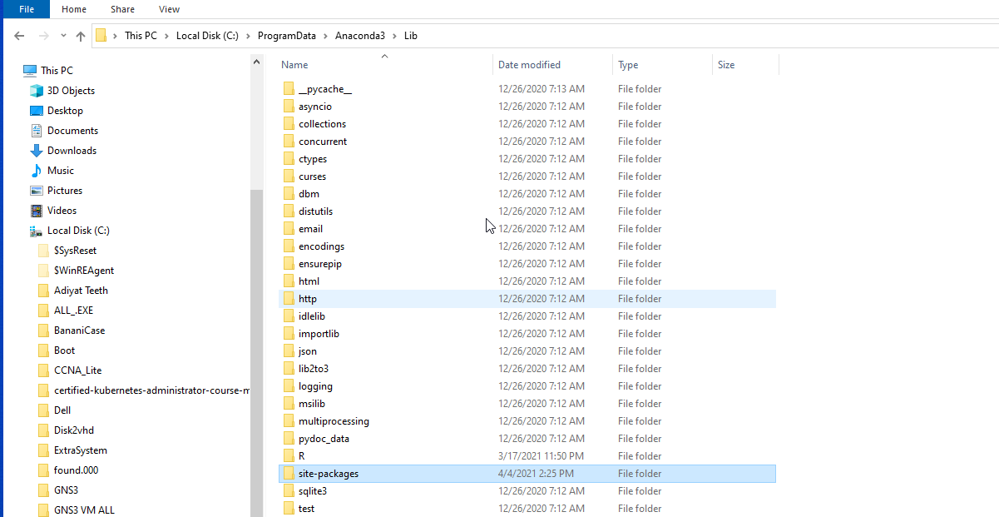

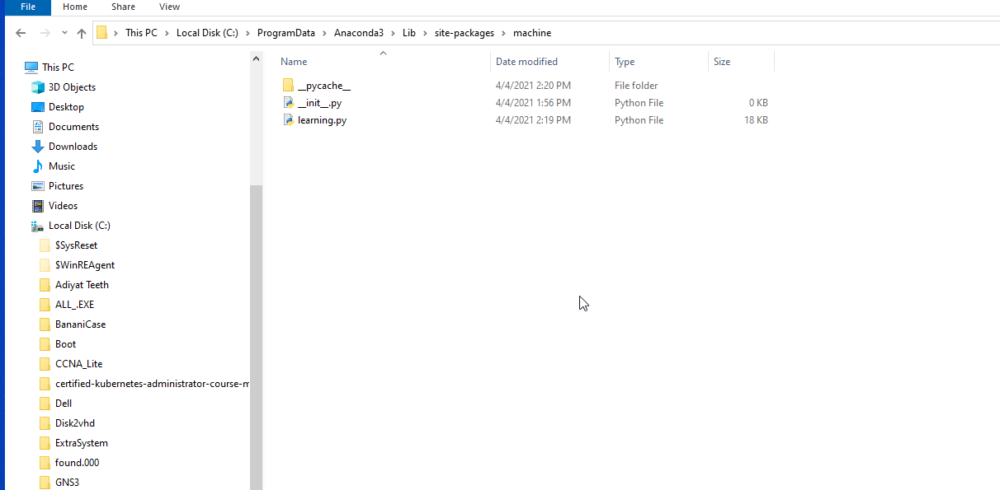

**Code for classificationreport function in the modelcomparison module:** 


def classificationreport(data,targetcolumn):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import train_test_split
    pd.options.display.float_format = "{:,.2f}".format
    X = data.drop(targetcolumn,axis=1)
    y = data[targetcolumn]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)
    from sklearn.linear_model import LogisticRegression
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score
    logmodel = LogisticRegression()
    logmodel.fit(X_train,y_train)
    predictions_lr = logmodel.predict(X_test)
    dtreemodel = DecisionTreeClassifier()
    dtreemodel.fit(X_train,y_train)
    predictions_dt = dtreemodel.predict(X_test)
    randforestmodel = RandomForestClassifier(n_estimators=600)
    randforestmodel.fit(X_train,y_train)
    predictions_rf = randforestmodel.predict(X_test)
    lr_accuracy = accuracy_score(y_test,predictions_lr)
    dt_accuracy = accuracy_score(y_test,predictions_dt)
    rf_accuracy = accuracy_score(y_test,predictions_rf)
    lr_f1_score = f1_score(y_test,predictions_lr, average=None)
    dt_f1_score = f1_score(y_test,predictions_dt, average=None)
    rf_f1_score = f1_score(y_test,predictions_rf, average=None)
    lr_recall = recall_score(y_test,predictions_lr, average=None)
    dt_recall = recall_score(y_test,predictions_dt, average=None)
    rf_recall = recall_score(y_test,predictions_rf, average=None)
    lr_precision = precision_score(y_test,predictions_lr, average=None)
    dt_precision = precision_score(y_test,predictions_dt, average=None)
    rf_precision = precision_score(y_test,predictions_rf, average=None)
    accuracy_table = {'Accuracy':[lr_accuracy, dt_accuracy, rf_accuracy]}
    accuracy_df = pd.DataFrame(accuracy_table, index =['Logistic Regression', 'Decision Tree', 'Random Forest'])
    
    print("Classification Report for Logistic Regression:\n")
    print(classification_report(y_test,predictions_lr))
    print("Classification Report for Decision Tree:\n")
    print(classification_report(y_test,predictions_dt))
    print("Classification Report for Random Forest:\n")
    print(classification_report(y_test,predictions_rf))


**Code for confusionmatrix function in the modelcomparison module:**


def confusionmatrix(data,targetcolumn):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import train_test_split
    pd.options.display.float_format = "{:,.2f}".format
    X = data.drop(targetcolumn,axis=1)
    y = data[targetcolumn]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)
    from sklearn.linear_model import LogisticRegression
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score
    logmodel = LogisticRegression()
    logmodel.fit(X_train,y_train)
    predictions_lr = logmodel.predict(X_test)
    dtreemodel = DecisionTreeClassifier()
    dtreemodel.fit(X_train,y_train)
    predictions_dt = dtreemodel.predict(X_test)
    randforestmodel = RandomForestClassifier(n_estimators=600)
    randforestmodel.fit(X_train,y_train)
    predictions_rf = randforestmodel.predict(X_test)

    print("\nConfusion Matrix for Logistic Regression:\n")
    print(confusion_matrix(y_test,predictions_lr))
    print("\nConfusion Matrix for Decision Tree:\n")
    print(confusion_matrix(y_test,predictions_dt))
    print("\nConfusion Matrix for Random Forest:\n")
    print(confusion_matrix(y_test,predictions_rf))
 

**Code for detailreport function in the modelcomparison module:**


def detailreport(data,targetcolumn):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import train_test_split
    pd.options.display.float_format = "{:,.2f}".format
    X = data.drop(targetcolumn,axis=1)
    y = data[targetcolumn]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)
    from sklearn.linear_model import LogisticRegression
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score
    logmodel = LogisticRegression()
    logmodel.fit(X_train,y_train)
    predictions_lr = logmodel.predict(X_test)
    dtreemodel = DecisionTreeClassifier()
    dtreemodel.fit(X_train,y_train)
    predictions_dt = dtreemodel.predict(X_test)
    randforestmodel = RandomForestClassifier(n_estimators=600)
    randforestmodel.fit(X_train,y_train)
    predictions_rf = randforestmodel.predict(X_test)
    lrcm = confusion_matrix(y_test,predictions_lr)
    dtcm = confusion_matrix(y_test,predictions_dt)
    rfcm = confusion_matrix(y_test,predictions_rf)
    lr_accuracy = accuracy_score(y_test,predictions_lr)
    dt_accuracy = accuracy_score(y_test,predictions_dt)
    rf_accuracy = accuracy_score(y_test,predictions_rf)
    lr_f1_score = f1_score(y_test,predictions_lr, average=None)
    dt_f1_score = f1_score(y_test,predictions_dt, average=None)
    rf_f1_score = f1_score(y_test,predictions_rf, average=None)
    lr_recall = recall_score(y_test,predictions_lr, average=None)
    dt_recall = recall_score(y_test,predictions_dt, average=None)
    rf_recall = recall_score(y_test,predictions_rf, average=None)
    lr_precision = precision_score(y_test,predictions_lr, average=None)
    dt_precision = precision_score(y_test,predictions_dt, average=None)
    rf_precision = precision_score(y_test,predictions_rf, average=None)
    accuracy_table = {'Accuracy':[lr_accuracy, dt_accuracy, rf_accuracy]}
    accuracy_df = pd.DataFrame(accuracy_table, index =['Logistic Regression', 'Decision Tree', 'Random Forest'])
    precision_recall_f1score_table = {'F1_Score':[lr_f1_score[0], dt_f1_score[0],rf_f1_score[0],lr_f1_score[1],  dt_f1_score[1],
                                                  rf_f1_score[1]],
                                      'Recall':[lr_recall[0],dt_recall[0],rf_recall[0], lr_recall[1], dt_recall[1],  
                                                rf_recall[1]],
                                      'Precision':[lr_precision[0],dt_precision[0],rf_precision[0],lr_precision[1], 
                                                 dt_precision[1],rf_precision[1]]}
    precision_recall_f1score_df = pd.DataFrame(precision_recall_f1score_table, index =['Logistic Regression 0',
                                                                                       'Decision Tree 0','Random Forest 0',
                                                                                       'Logistic Regression 1', 
                                                                                        'Decision Tree 1',
                                                                                        'Random Forest 1'])
    
    print("Classification Report for Logistic Regression:\n")
    print(classification_report(y_test,predictions_lr))
    print("Classification Report for Decision Tree:\n")
    print(classification_report(y_test,predictions_dt))
    print("Classification Report for Random Forest:\n")
    print(classification_report(y_test,predictions_rf))
    print("\nConfusion Matrix for Logistic Regression:\n")
    print(confusion_matrix(y_test,predictions_lr))
    print("\nConfusion Matrix for Decision Tree:\n")
    print(confusion_matrix(y_test,predictions_dt))
    print("\nConfusion Matrix for Random Forest:\n")
    print(confusion_matrix(y_test,predictions_rf))
    print("\nAccuracy for Logistic Regression, Decision Tree and Random Forest :\n")
    print(accuracy_df)
    accuracy_df.plot(kind="bar", color=['coral'],figsize=(12,8), fontsize=15)
    plt.title("Accuracy for Logistic Regression, Decision Tree and Random Forest Models", fontsize=20)
    plt.xticks(rotation=0, horizontalalignment="center")
    plt.xlabel("Machine Learning Model")
    plt.ylabel("Accuracy of the Model")
    print("\nF1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest :\n\n")
    print(precision_recall_f1score_df)
    print("\n\n")
    plt.figure(figsize=(11,7))
    precision_recall_f1score_df.transpose().plot(kind="bar",figsize=(12,8), fontsize=15)
    plt.title("F1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest Models", fontsize=17)
    plt.xticks(rotation=0, horizontalalignment="center")        
    
 

**Code for modelcomparison function in the modelcomparison module:**


def modelcomparison(data,targetcolumn):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import train_test_split
    pd.options.display.float_format = "{:,.2f}".format
    X = data.drop(targetcolumn,axis=1)
    y = data[targetcolumn]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)
    from sklearn.linear_model import LogisticRegression
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score
    logmodel = LogisticRegression()
    logmodel.fit(X_train,y_train)
    predictions_lr = logmodel.predict(X_test)
    dtreemodel = DecisionTreeClassifier()
    dtreemodel.fit(X_train,y_train)
    predictions_dt = dtreemodel.predict(X_test)
    randforestmodel = RandomForestClassifier(n_estimators=600)
    randforestmodel.fit(X_train,y_train)
    predictions_rf = randforestmodel.predict(X_test)
    lr_accuracy = accuracy_score(y_test,predictions_lr)
    dt_accuracy = accuracy_score(y_test,predictions_dt)
    rf_accuracy = accuracy_score(y_test,predictions_rf)
    lr_f1_score = f1_score(y_test,predictions_lr, average=None)
    dt_f1_score = f1_score(y_test,predictions_dt, average=None)
    rf_f1_score = f1_score(y_test,predictions_rf, average=None)
    lr_recall = recall_score(y_test,predictions_lr, average=None)
    dt_recall = recall_score(y_test,predictions_dt, average=None)
    rf_recall = recall_score(y_test,predictions_rf, average=None)
    lr_precision = precision_score(y_test,predictions_lr, average=None)
    dt_precision = precision_score(y_test,predictions_dt, average=None)
    rf_precision = precision_score(y_test,predictions_rf, average=None)
    accuracy_table = {'Accuracy':[lr_accuracy, dt_accuracy, rf_accuracy]}
    accuracy_df = pd.DataFrame(accuracy_table, index =['Logistic Regression', 'Decision Tree', 'Random Forest'])

    precision_recall_f1score_table = {'F1_Score':[lr_f1_score[0], dt_f1_score[0],rf_f1_score[0],lr_f1_score[1],  dt_f1_score[1],
                                                  rf_f1_score[1]],
                                      'Recall':[lr_recall[0],dt_recall[0],rf_recall[0], lr_recall[1], dt_recall[1],  
                                                rf_recall[1]],
                                      'Precision':[lr_precision[0],dt_precision[0],rf_precision[0],lr_precision[1], 
                                                 dt_precision[1],rf_precision[1]]}
    precision_recall_f1score_df = pd.DataFrame(precision_recall_f1score_table, index =['Logistic Regression 0',
                                                                                       'Decision Tree 0','Random Forest 0',
                                                                                       'Logistic Regression 1', 
                                                                                        'Decision Tree 1',
                                                                                        'Random Forest 1'])
    
    print("\nConfusion Matrix for Logistic Regression:\n")
    print(confusion_matrix(y_test,predictions_lr))
    print("\nConfusion Matrix for Decision Tree:\n")
    print(confusion_matrix(y_test,predictions_dt))
    print("\nConfusion Matrix for Random Forest:\n")
    print(confusion_matrix(y_test,predictions_rf))
    print("\nAccuracy for Logistic Regression, Decision Tree and Random Forest :\n")
    print(accuracy_df)
    accuracy_df.plot(kind="bar", color=['coral'],figsize=(12,8), fontsize=15)
    plt.title("Accuracy for Logistic Regression, Decision Tree and Random Forest Models", fontsize=20)
    plt.xticks(rotation=0, horizontalalignment="center")
    plt.xlabel("Machine Learning Model")
    plt.ylabel("Accuracy of the Model")
    print("\nF1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest :\n\n")
    print(precision_recall_f1score_df)
    print("\n\n")
    plt.figure(figsize=(11,7))
    precision_recall_f1score_df.transpose().plot(kind="bar",figsize=(12,8), fontsize=15)
    plt.title("F1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest Models", fontsize=17)
    plt.xticks(rotation=0, horizontalalignment="center")
    


**Code for modelcomparisonplot function in the modelcomparison module:**


def modelcomparisonplot(data,targetcolumn):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import train_test_split
    pd.options.display.float_format = "{:,.2f}".format
    X = data.drop(targetcolumn,axis=1)
    y = data[targetcolumn]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)
    from sklearn.linear_model import LogisticRegression
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score
    logmodel = LogisticRegression()
    logmodel.fit(X_train,y_train)
    predictions_lr = logmodel.predict(X_test)
    dtreemodel = DecisionTreeClassifier()
    dtreemodel.fit(X_train,y_train)
    predictions_dt = dtreemodel.predict(X_test)
    randforestmodel = RandomForestClassifier(n_estimators=600)
    randforestmodel.fit(X_train,y_train)
    predictions_rf = randforestmodel.predict(X_test)
    lrcm = confusion_matrix(y_test,predictions_lr)
    dtcm = confusion_matrix(y_test,predictions_dt)
    rfcm = confusion_matrix(y_test,predictions_rf)
    lr_accuracy = accuracy_score(y_test,predictions_lr)
    dt_accuracy = accuracy_score(y_test,predictions_dt)
    rf_accuracy = accuracy_score(y_test,predictions_rf)
    lr_f1_score = f1_score(y_test,predictions_lr, average=None)
    dt_f1_score = f1_score(y_test,predictions_dt, average=None)
    rf_f1_score = f1_score(y_test,predictions_rf, average=None)
    lr_recall = recall_score(y_test,predictions_lr, average=None)
    dt_recall = recall_score(y_test,predictions_dt, average=None)
    rf_recall = recall_score(y_test,predictions_rf, average=None)
    lr_precision = precision_score(y_test,predictions_lr, average=None)
    dt_precision = precision_score(y_test,predictions_dt, average=None)
    rf_precision = precision_score(y_test,predictions_rf, average=None)
    accuracy_table = {'Accuracy':[lr_accuracy, dt_accuracy, rf_accuracy]}
    accuracy_df = pd.DataFrame(accuracy_table, index =['Logistic Regression', 'Decision Tree', 'Random Forest'])

    precision_recall_f1score_table = {'F1_Score':[lr_f1_score[0], dt_f1_score[0],rf_f1_score[0],lr_f1_score[1],  dt_f1_score[1],
                                                  rf_f1_score[1]],
                                      'Recall':[lr_recall[0],dt_recall[0],rf_recall[0], lr_recall[1], dt_recall[1],  
                                                rf_recall[1]],
                                      'Precision':[lr_precision[0],dt_precision[0],rf_precision[0],lr_precision[1], 
                                                 dt_precision[1],rf_precision[1]]}
    precision_recall_f1score_df = pd.DataFrame(precision_recall_f1score_table, index =['Logistic Regression 0',
                                                                                       'Decision Tree 0','Random Forest 0',
                                                                                       'Logistic Regression 1', 
                                                                                        'Decision Tree 1',
                                                                                        'Random Forest 1'])
    
    print(accuracy_df)
    accuracy_df.plot(kind="bar", color=['coral'],figsize=(12,8), fontsize=15)
    plt.title("Accuracy for Logistic Regression, Decision Tree and Random Forest Models", fontsize=20)
    plt.xticks(rotation=0, horizontalalignment="center")
    plt.xlabel("Machine Learning Model")
    plt.ylabel("Accuracy of the Model")
    print("\nF1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest :\n\n")
    print(precision_recall_f1score_df)
    print("\n\n")
    plt.figure(figsize=(11,7))
    precision_recall_f1score_df.transpose().plot(kind="bar",figsize=(12,8), fontsize=15)
    plt.title("F1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest Models", fontsize=17)
    plt.xticks(rotation=0, horizontalalignment="center")
 

**Now, let us import the package along with the module and call all the functions to see the outputs
that will show the evaluation of the tree Machine Learning Algorith Models.**

In [110]:
from machine import learning

In [111]:
dir(learning)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'classificationreport',
 'confusionmatrix',
 'detailreport',
 'modelcomparison',
 'modelcomparisonplot']

In [112]:
learning.classificationreport(final_data, 'NotFullyPaid')

Classification Report for Logistic Regression:

              precision    recall  f1-score   support

         0.0       0.85      0.99      0.91      3230
         1.0       0.41      0.02      0.04       598

    accuracy                           0.84      3828
   macro avg       0.63      0.51      0.48      3828
weighted avg       0.78      0.84      0.78      3828

Classification Report for Decision Tree:

              precision    recall  f1-score   support

         0.0       0.86      0.84      0.85      3230
         1.0       0.22      0.25      0.24       598

    accuracy                           0.75      3828
   macro avg       0.54      0.54      0.54      3828
weighted avg       0.76      0.75      0.75      3828

Classification Report for Random Forest:

              precision    recall  f1-score   support

         0.0       0.85      1.00      0.91      3230
         1.0       0.44      0.02      0.04       598

    accuracy                           0.84      3

In [113]:
learning.confusionmatrix(final_data, 'NotFullyPaid')


Confusion Matrix for Logistic Regression:

[[3213   17]
 [ 586   12]]

Confusion Matrix for Decision Tree:

[[2687  543]
 [ 447  151]]

Confusion Matrix for Random Forest:

[[3219   11]
 [ 585   13]]


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

         0.0       0.85      0.99      0.91      3230
         1.0       0.41      0.02      0.04       598

    accuracy                           0.84      3828
   macro avg       0.63      0.51      0.48      3828
weighted avg       0.78      0.84      0.78      3828

Classification Report for Decision Tree:

              precision    recall  f1-score   support

         0.0       0.86      0.83      0.84      3230
         1.0       0.21      0.26      0.23       598

    accuracy                           0.74      3828
   macro avg       0.54      0.54      0.54      3828
weighted avg       0.76      0.74      0.75      3828

Classification Report for Random Forest:

              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92      3230
         1.0       0.52      0.03      0.05       598

    accuracy                           0.84      3

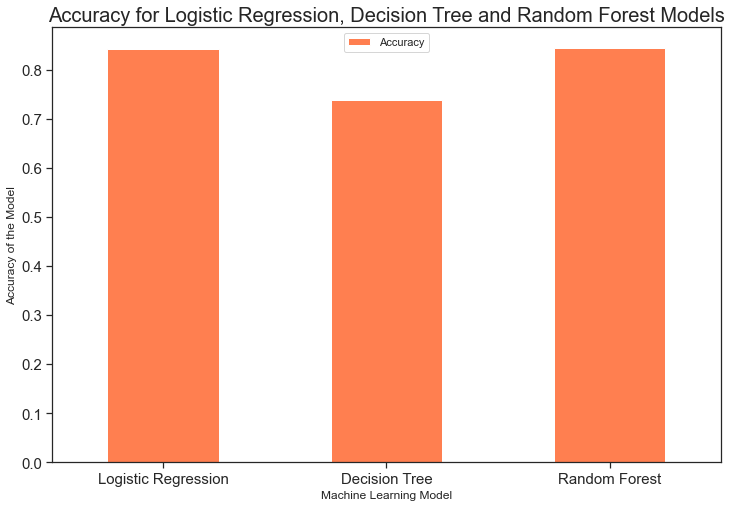

<Figure size 792x504 with 0 Axes>

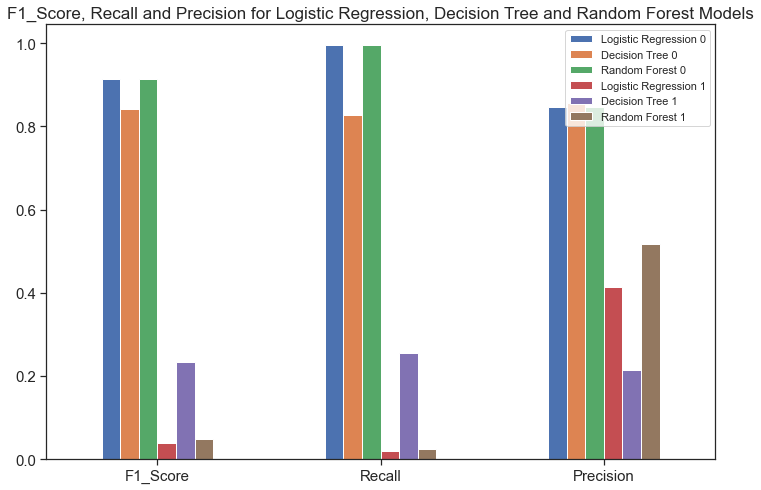

In [114]:
learning.detailreport(final_data, 'NotFullyPaid')


Confusion Matrix for Logistic Regression:

[[3213   17]
 [ 586   12]]

Confusion Matrix for Decision Tree:

[[2667  563]
 [ 447  151]]

Confusion Matrix for Random Forest:

[[3216   14]
 [ 584   14]]

Accuracy for Logistic Regression, Decision Tree and Random Forest :

                     Accuracy
Logistic Regression      0.84
Decision Tree            0.74
Random Forest            0.84

F1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest :


                       F1_Score  Recall  Precision
Logistic Regression 0      0.91    0.99       0.85
Decision Tree 0            0.84    0.83       0.86
Random Forest 0            0.91    1.00       0.85
Logistic Regression 1      0.04    0.02       0.41
Decision Tree 1            0.23    0.25       0.21
Random Forest 1            0.04    0.02       0.50





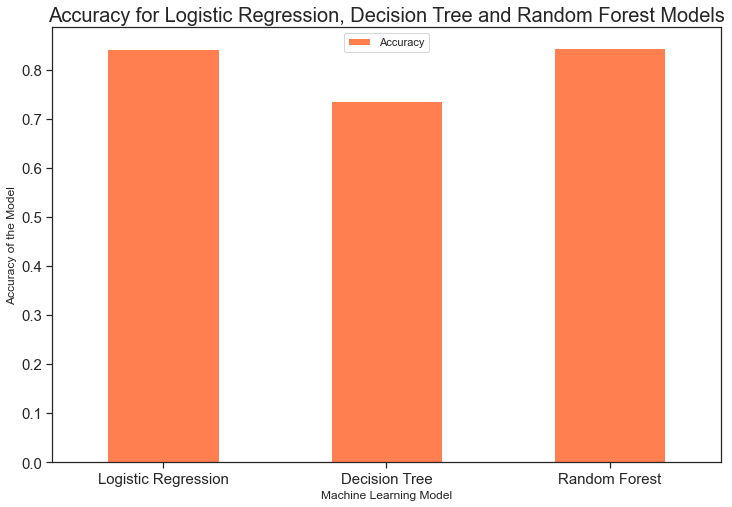

<Figure size 792x504 with 0 Axes>

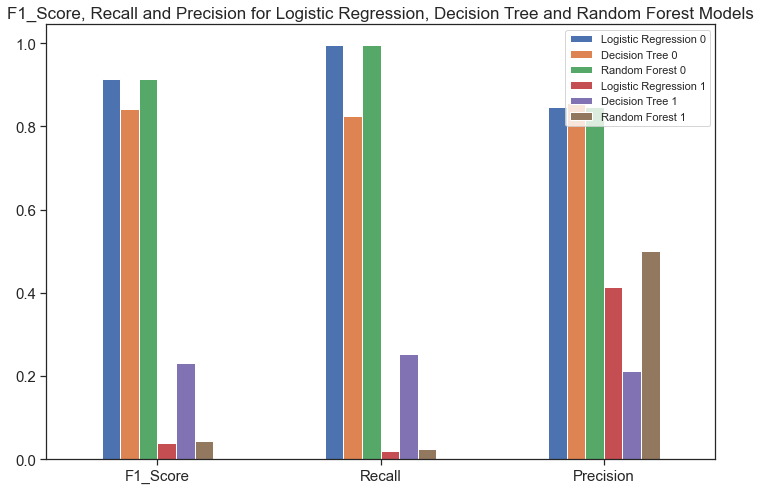

In [115]:
learning.modelcomparison(final_data, 'NotFullyPaid')

                     Accuracy
Logistic Regression      0.84
Decision Tree            0.74
Random Forest            0.84

F1_Score, Recall and Precision for Logistic Regression, Decision Tree and Random Forest :


                       F1_Score  Recall  Precision
Logistic Regression 0      0.91    0.99       0.85
Decision Tree 0            0.84    0.83       0.86
Random Forest 0            0.92    1.00       0.85
Logistic Regression 1      0.04    0.02       0.41
Decision Tree 1            0.23    0.25       0.21
Random Forest 1            0.04    0.02       0.52





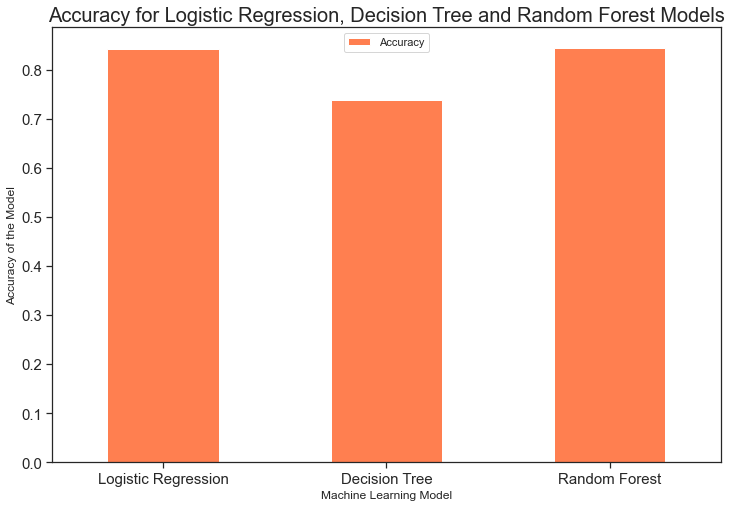

<Figure size 792x504 with 0 Axes>

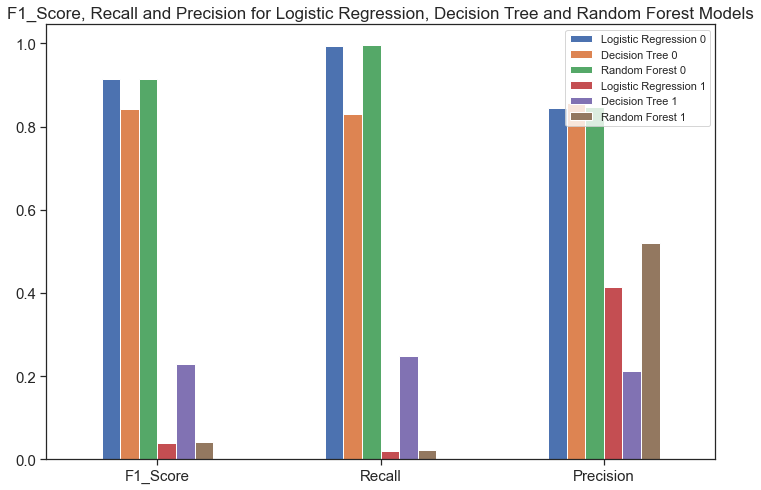

In [116]:
learning.modelcomparisonplot(final_data, 'NotFullyPaid')

# Conclusion:
**In this project we basically performed some Exploratory Data Analysis on the dataframe that we 
created importing(reading) the data available on the internet and then attempted to do some work with Machine Learning Project that we did by developing a simple package to give our project an end to end objective fullfilling purpose.**


**We need to have extensive study and understanding to be able to comprehensively evaluate the performance
of various Machine Learning Models that we are eyeing in near future in our program. But for now we get a feel of the Machine Learning Models as we work through to get some result of our data.**